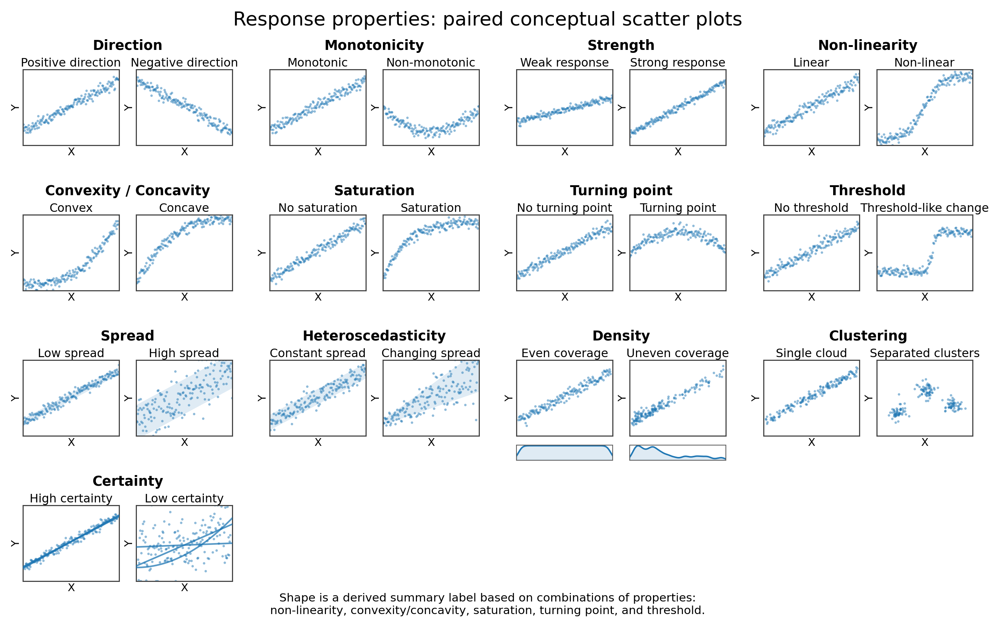

Excel file saved to: ./output/no_certainty.xlsx


,property,case,side,y_sd,pearson_r,spearman_rho,covariance,distance_covariance,distance_correlation,x_uniform_ks_distance,...,lowess_curve_amplitude_div_y_sd,lowess_r2,lowess_first_derivative_sign_changes,gam_residual_sd,gam_residual_sd_div_y_sd,gam_curve_amplitude,gam_curve_amplitude_div_y_sd,gam_r2,gam_first_derivative_sign_changes,n_valid
0,Direction,Positive direction,left,0.2006,0.9816,0.9825,0.0573,0.1715,0.9809,0.0059,...,3.3987,0.9650,0,0.0377,0.1882,0.6688,3.3343,0.9646,0,170
1,Direction,Negative direction,right,0.2061,-0.9793,-0.9806,-0.0588,0.1727,0.9748,0.0059,...,3.3672,0.9617,0,0.0404,0.1962,0.6931,3.3633,0.9615,0,170
2,Monotonicity,Monotonic,left,0.1979,0.9803,0.9807,0.0565,0.1700,0.9778,0.0059,...,3.3362,0.9622,0,0.0386,0.1950,0.6598,3.3344,0.9620,0,170
3,Monotonicity,Non-monotonic,right,0.1011,-0.0017,0.0115,-0.0001,0.0547,0.4525,0.0059,...,3.0390,0.8441,1,0.0401,0.3962,0.3107,3.0721,0.8430,1,170
4,Strength,Weak response,left,0.0953,0.9682,0.9715,0.0269,0.1157,0.9672,0.0059,...,3.2220,0.9382,0,0.0237,0.2485,0.3151,3.3061,0.9383,0,170
5,Strength,Strong response,right,0.2031,0.9931,0.9933,0.0587,0.1750,0.9914,0.0059,...,3.4672,0.9866,0,0.0236,0.1160,0.6987,3.4400,0.9865,0,170
6,Non-linearity,Linear,left,0.2121,0.9787,0.9805,0.0605,0.1755,0.9766,0.0059,...,3.4532,0.9594,0,0.0429,0.2020,0.7217,3.4018,0.9592,0,170
7,Non-linearity,Non-linear,right,0.3412,0.9622,0.9643,0.0956,0.2381,0.9722,0.0059,...,2.4516,0.9867,1,0.0396,0.1160,0.8347,2.4462,0.9865,1,170
8,Convexity / Concavity,Convex,left,0.2525,0.9147,0.9438,0.0673,0.1817,0.9368,0.0059,...,3.2914,0.9753,1,0.0396,0.1569,0.8350,3.3074,0.9754,1,170
9,Convexity / Concavity,Concave,right,0.2483,0.9204,0.9530,0.0665,0.1807,0.9409,0.0059,...,3.3603,0.9770,0,0.0377,0.1519,0.8352,3.3638,0.9769,0,170


In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from scipy.stats import pearsonr, spearmanr, ks_2samp, wasserstein_distance
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# 0. Basic settings
# ==========================================================

SEED = 88

np.random.seed(SEED)
rng = np.random.default_rng(SEED)

x = np.linspace(0, 1, 170)

POINT_COLOR = "C0"
BUFFER_COLOR = "C0"

properties = [
    ("Direction", "Positive direction", "Negative direction"),
    ("Monotonicity", "Monotonic", "Non-monotonic"),
    ("Strength", "Weak response", "Strong response"),
    ("Non-linearity", "Linear", "Non-linear"),
    ("Convexity / Concavity", "Convex", "Concave"),
    ("Saturation", "No saturation", "Saturation"),
    ("Turning point", "No turning point", "Turning point"),
    ("Threshold", "No threshold", "Threshold-like change"),
    ("Spread", "Low spread", "High spread"),
    ("Heteroscedasticity", "Constant spread", "Changing spread"),
    ("Density", "Even coverage", "Uneven coverage"),
    ("Clustering", "Single cloud", "Separated clusters"),
    ("Certainty", "High certainty", "Low certainty"),
]


# ==========================================================
# 1. Base curve / structure generation
# ==========================================================

def curve_data(prop):
    xx = x.copy()

    if prop == "Direction":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.86 - 0.68 * xx),
        )

    if prop == "Monotonicity":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.18 + 1.15 * (xx - 0.50) ** 2),
        )

    if prop == "Strength":
        return (
            (xx, 0.30 + 0.32 * xx),
            (xx, 0.14 + 0.70 * xx),
        )

    if prop == "Non-linearity":
        y_linear = 0.15 + 0.72 * xx
        y_nonlinear = 0.08 + 0.84 / (1 + np.exp(-11.0 * (xx - 0.50)))
        return (
            (xx, y_linear),
            (xx, y_nonlinear),
        )

    if prop == "Convexity / Concavity":
        y_convex = 0.08 + 0.86 * (xx ** 2.8)
        y_concave = 0.08 + 0.86 * (1 - (1 - xx) ** 2.8)
        return (
            (xx, y_convex),
            (xx, y_concave),
        )

    if prop == "Saturation":
        return (
            (xx, 0.14 + 0.76 * xx),
            (xx, 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))),
        )

    if prop == "Turning point":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.78 - 1.10 * (xx - 0.52) ** 2),
        )

    if prop == "Threshold":
        y_no_threshold = 0.18 + 0.68 * xx
        threshold = 0.58
        y_threshold = 0.25 + 0.53 / (1 + np.exp(-45 * (xx - threshold)))
        return (
            (xx, y_no_threshold),
            (xx, y_threshold),
        )

    if prop == "Spread":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.18 + 0.68 * xx),
        )

    if prop == "Heteroscedasticity":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.18 + 0.68 * xx),
        )

    if prop == "Density":
        x_even = np.linspace(0.02, 0.98, 170)

        x_uneven = np.concatenate([
            rng.uniform(0.02, 0.34, 110),
            rng.uniform(0.34, 0.98, 60),
        ])
        x_uneven = np.sort(x_uneven)

        return (
            (x_even, 0.18 + 0.68 * x_even),
            (x_uneven, 0.18 + 0.68 * x_uneven),
        )

    if prop == "Clustering":
        x_single = rng.uniform(0.02, 0.98, 170)
        y_single = 0.18 + 0.68 * x_single

        n1, n2, n3 = 55, 60, 55

        x_c1 = rng.normal(0.22, 0.045, n1)
        y_c1 = rng.normal(0.30, 0.045, n1)

        x_c2 = rng.normal(0.52, 0.050, n2)
        y_c2 = rng.normal(0.60, 0.050, n2)

        x_c3 = rng.normal(0.80, 0.045, n3)
        y_c3 = rng.normal(0.40, 0.045, n3)

        x_cluster = np.concatenate([x_c1, x_c2, x_c3])
        y_cluster = np.concatenate([y_c1, y_c2, y_c3])

        x_cluster = np.clip(x_cluster, 0.02, 0.98)
        y_cluster = np.clip(y_cluster, 0.05, 0.95)

        return (
            (x_single, y_single),
            (x_cluster, y_cluster),
        )

    if prop == "Certainty":
        x_good = np.linspace(0.02, 0.98, 170)
        y_good = 0.18 + 0.68 * x_good

        x_bad = np.linspace(0.02, 0.98, 170)
        y_bad = 0.35 + 0.30 * x_bad

        return (
            (x_good, y_good),
            (x_bad, y_bad),
        )

    raise ValueError(f"Unknown property: {prop}")


# ==========================================================
# 2. Generate final scatter data
# This matches the noise logic in your plotting code.
# ==========================================================

def generate_scatter_data(prop, xx, yy, side):
    xx = np.asarray(xx)
    yy = np.asarray(yy)

    if prop == "Certainty":
        if side == 0:
            noise_sd = 0.030
            y_points = yy + np.random.normal(0, noise_sd, len(yy))
        else:
            noise_sd = 0.20
            y_points = yy + np.random.normal(0, noise_sd, len(yy))

    elif prop == "Strength":
        noise_sd = 0.025
        y_points = yy + np.random.normal(0, noise_sd, len(yy))

    elif prop == "Threshold":
        if side == 0:
            noise_sd = 0.040
            y_points = yy + np.random.normal(0, noise_sd, len(yy))
        else:
            noise_sd = 0.035
            y_points = yy + np.random.normal(0, noise_sd, len(yy))

    elif prop == "Spread":
        noise_sd = 0.035 if side == 0 else 0.17
        y_points = yy + np.random.normal(0, noise_sd, len(yy))

    elif prop == "Heteroscedasticity":
        if side == 0:
            noise_sd = np.full_like(xx, 0.075)
        else:
            noise_sd = 0.025 + 0.18 * xx

        y_points = yy + np.random.normal(0, noise_sd, len(yy))

    elif prop == "Clustering":
        noise_sd = 0.035
        y_points = yy + np.random.normal(0, noise_sd, len(yy))

    else:
        noise_sd = 0.040
        y_points = yy + np.random.normal(0, noise_sd, len(yy))

    y_points = np.clip(y_points, 0, 1)

    return xx, y_points


# ==========================================================
# 3. Generate all final datasets once
# These datasets are used for BOTH plotting and metrics.
# ==========================================================

np.random.seed(SEED)
rng = np.random.default_rng(SEED)

plot_metric_data = {}

for prop, left_title, right_title in properties:
    (xl_base, yl_base), (xr_base, yr_base) = curve_data(prop)

    xl, yl = generate_scatter_data(prop, xl_base, yl_base, side=0)
    xr, yr = generate_scatter_data(prop, xr_base, yr_base, side=1)

    plot_metric_data[prop] = {
        "left_title": left_title,
        "right_title": right_title,
        "left": {
            "x": xl,
            "y": yl,
            "x_base": xl_base,
            "y_base": yl_base,
        },
        "right": {
            "x": xr,
            "y": yr,
            "x_base": xr_base,
            "y_base": yr_base,
        },
    }


# ==========================================================
# 4. Plotting helpers
# ==========================================================

def kde_manual(values, grid, bandwidth=0.035):
    values = np.asarray(values)
    grid = np.asarray(grid)

    dens = np.zeros_like(grid, dtype=float)

    for v in values:
        dens += np.exp(-0.5 * ((grid - v) / bandwidth) ** 2)

    dens /= max(len(values), 1)

    if dens.max() > 0:
        dens = dens / dens.max()

    return dens


def style_axis(ax):
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([])
    ax.set_yticks([])

    for spine in ["top", "right", "bottom", "left"]:
        ax.spines[spine].set_visible(True)
        ax.spines[spine].set_linewidth(0.70)
        ax.spines[spine].set_color("0.25")

    ax.set_xlabel("X", fontsize=7, labelpad=1)
    ax.set_ylabel("Y", fontsize=7, labelpad=1)


def add_buffer(ax, xx, yy, buffer_width, alpha=0.14):
    xx = np.asarray(xx)
    yy = np.asarray(yy)

    order = np.argsort(xx)
    xx_o = xx[order]
    yy_o = yy[order]

    if np.isscalar(buffer_width):
        bw = np.full_like(xx_o, buffer_width, dtype=float)
    else:
        bw = np.asarray(buffer_width)[order]

    ax.fill_between(
        xx_o,
        yy_o - bw,
        yy_o + bw,
        color=BUFFER_COLOR,
        alpha=alpha,
        linewidth=0,
        zorder=1,
    )


def draw_density_inset(ax, xx):
    grid = np.linspace(0, 1, 300)
    dens = kde_manual(xx, grid, bandwidth=0.035)

    ax_den = inset_axes(
        ax,
        width="100%",
        height="20%",
        loc="lower left",
        bbox_to_anchor=(0, -0.32, 1, 1),
        bbox_transform=ax.transAxes,
        borderpad=0,
    )

    ax_den.plot(grid, dens, linewidth=0.95, color=POINT_COLOR)
    ax_den.fill_between(grid, 0, dens, color=BUFFER_COLOR, alpha=0.14)

    ax_den.set_xlim(0, 1)
    ax_den.set_ylim(0, 1.05)
    ax_den.set_xticks([])
    ax_den.set_yticks([])

    for spine in ["top", "right", "bottom", "left"]:
        ax_den.spines[spine].set_visible(True)
        ax_den.spines[spine].set_linewidth(0.50)
        ax_den.spines[spine].set_color("0.35")


def draw_panel_from_final_data(ax, xx, yy, x_base, y_base, title, prop, side):
    xx = np.asarray(xx)
    yy = np.asarray(yy)

    # Visual buffers only. Metrics are computed from xx, yy.
    if prop == "Spread":
        noise_sd = 0.035 if side == 0 else 0.17
        add_buffer(ax, x_base, y_base, noise_sd * 1.35, alpha=0.14)

    elif prop == "Heteroscedasticity":
        if side == 0:
            noise_sd = np.full_like(x_base, 0.075)
        else:
            noise_sd = 0.025 + 0.18 * x_base

        add_buffer(ax, x_base, y_base, noise_sd * 1.35, alpha=0.14)

    ax.scatter(
        xx,
        yy,
        s=2.5,
        alpha=0.5,
        color=POINT_COLOR,
        edgecolors="none",
        linewidths=0,
        zorder=2,
    )

    # Visual lines for certainty only.
    if prop == "Certainty":
        x_line = np.linspace(0, 1, 200)

        if side == 0:
            lines = [
                0.18 + 0.68 * x_line,
                0.19 + 0.66 * x_line,
                0.17 + 0.70 * x_line,
            ]
        else:
            lines = [
                0.20 + 0.55 * x_line,
                0.45 + 0.05 * x_line,
                0.18 + 0.65 * (x_line ** 2),
            ]

        for line in lines:
            ax.plot(
                x_line,
                np.clip(line, 0, 1),
                linewidth=1.05,
                alpha=0.75,
                color=POINT_COLOR,
                zorder=3,
            )

    ax.set_title(title, fontsize=7.6, pad=2)
    style_axis(ax)


# ==========================================================
# 5. Plot first
# ==========================================================

n_cols = 4
n_rows = int(np.ceil(len(properties) / n_cols))

fig = plt.figure(figsize=(9.2, 5.5), dpi=300)

outer = GridSpec(
    n_rows,
    n_cols,
    figure=fig,
    hspace=0.32,
    wspace=0.18,
)

for idx, (prop, left_title, right_title) in enumerate(properties):
    row = idx // n_cols
    col = idx % n_cols

    cell = GridSpecFromSubplotSpec(
        2,
        2,
        subplot_spec=outer[row, col],
        height_ratios=[0.20, 0.80],
        hspace=0.32,
        wspace=0.18,
    )

    title_ax = fig.add_subplot(cell[0, :])
    title_ax.axis("off")

    title_ax.text(
        0.5,
        0.45,
        prop,
        ha="center",
        va="center",
        fontsize=8.8,
        fontweight="bold",
    )

    data = plot_metric_data[prop]

    ax_l = fig.add_subplot(cell[1, 0])
    ax_r = fig.add_subplot(cell[1, 1])

    draw_panel_from_final_data(
        ax_l,
        data["left"]["x"],
        data["left"]["y"],
        data["left"]["x_base"],
        data["left"]["y_base"],
        data["left_title"],
        prop,
        side=0,
    )

    draw_panel_from_final_data(
        ax_r,
        data["right"]["x"],
        data["right"]["y"],
        data["right"]["x_base"],
        data["right"]["y_base"],
        data["right_title"],
        prop,
        side=1,
    )

    if prop == "Density":
        ax_l.set_xlabel("")
        ax_r.set_xlabel("")
        draw_density_inset(ax_l, data["left"]["x"])
        draw_density_inset(ax_r, data["right"]["x"])

if len(properties) % n_cols != 0:
    empty_ax = fig.add_subplot(outer[-1, -1])
    empty_ax.axis("off")

fig.suptitle(
    "Response properties: paired conceptual scatter plots",
    fontsize=12.5,
    y=0.995,
)

shape_note = (
    "Shape is a derived summary label based on combinations of properties:\n"
    "non-linearity, convexity/concavity, saturation, turning point, and threshold."
)

fig.text(
    0.5,
    0.022,
    shape_note,
    ha="center",
    va="center",
    fontsize=7.5,
)

plt.subplots_adjust(
    left=0.045,
    right=0.975,
    top=0.955,
    bottom=0.06,
)

plt.show()


# ==========================================================
# 6. Metric helper functions
# ==========================================================

def _to_valid_arrays(x, y):
    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()

    valid = np.isfinite(x) & np.isfinite(y)
    return x[valid], y[valid]


def _safe_divide(a, b):
    if b == 0 or not np.isfinite(b):
        return np.nan
    return a / b


def _minmax_norm(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max) or v_max == v_min:
        return np.full_like(v, np.nan, dtype=float)

    return (v - v_min) / (v_max - v_min)


def _endpoint_slope(x, y):
    if len(x) < 2:
        return np.nan

    return _safe_divide(y[-1] - y[0], x[-1] - x[0])


def _segment_masks_by_order(n):
    i1 = n // 3
    i2 = 2 * n // 3

    early = np.zeros(n, dtype=bool)
    middle = np.zeros(n, dtype=bool)
    late = np.zeros(n, dtype=bool)

    early[:i1] = True
    middle[i1:i2] = True
    late[i2:] = True

    return early, middle, late


def _residual_sd(y, y_hat):
    residuals = y - y_hat

    if len(residuals) < 2:
        return np.nan

    return np.nanstd(residuals, ddof=1)


def _r2_score(y, y_hat):
    ss_res = np.nansum((y - y_hat) ** 2)
    ss_tot = np.nansum((y - np.nanmean(y)) ** 2)

    if ss_tot == 0:
        return np.nan

    return 1 - ss_res / ss_tot


def _count_derivative_sign_changes(x_curve, y_curve, slope_tol=1e-6):
    x_curve = np.asarray(x_curve, dtype=float)
    y_curve = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x_curve) & np.isfinite(y_curve)
    x_curve = x_curve[valid]
    y_curve = y_curve[valid]

    if len(x_curve) < 4:
        return np.nan

    order = np.argsort(x_curve)
    x_curve = x_curve[order]
    y_curve = y_curve[order]

    dx = np.diff(x_curve)
    dy = np.diff(y_curve)

    valid_diff = dx != 0

    if valid_diff.sum() < 3:
        return np.nan

    slopes = dy[valid_diff] / dx[valid_diff]

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) < 2:
        return 0

    return int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))


# ==========================================================
# 7. Metric functions
# ==========================================================

def compute_x_coverage_metrics(x, n_bins=10):
    x = np.asarray(x, dtype=float).ravel()
    x = x[np.isfinite(x)]

    result = {
        "x_uniform_ks_distance": np.nan,
        "equal_width_bin_x_bin_count_cv": np.nan,
    }

    if len(x) < 3:
        return result

    x_min = np.nanmin(x)
    x_max = np.nanmax(x)

    if x_max > x_min:
        x_norm = (x - x_min) / (x_max - x_min)
        x_sorted = np.sort(x_norm)
        n = len(x_sorted)

        d_plus = np.max(np.arange(1, n + 1) / n - x_sorted)
        d_minus = np.max(x_sorted - np.arange(0, n) / n)

        result["x_uniform_ks_distance"] = max(d_plus, d_minus)

    if len(x) >= n_bins:
        counts, _ = np.histogram(x, bins=n_bins)

        mean_count = np.mean(counts)
        sd_count = np.std(counts, ddof=1)

        if mean_count > 0:
            result["equal_width_bin_x_bin_count_cv"] = sd_count / mean_count

    return result


def compute_correlation_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    result = {
        "pearson_r": np.nan,
        "spearman_rho": np.nan,
        "covariance": np.nan,
    }

    if len(x) < 3:
        return result

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return result

    result["pearson_r"] = pearsonr(x, y)[0]
    result["spearman_rho"] = spearmanr(x, y)[0]
    result["covariance"] = np.cov(x, y, ddof=1)[0, 1]

    return result


def _double_center_distance_matrix(a):
    a = np.asarray(a, dtype=float).reshape(-1, 1)

    dist = squareform(pdist(a, metric="euclidean"))

    row_mean = dist.mean(axis=1, keepdims=True)
    col_mean = dist.mean(axis=0, keepdims=True)
    grand_mean = dist.mean()

    return dist - row_mean - col_mean + grand_mean


def compute_distance_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    result = {
        "distance_covariance": np.nan,
        "distance_correlation": np.nan,
    }

    if len(x) < 3:
        return result

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return result

    A = _double_center_distance_matrix(x)
    B = _double_center_distance_matrix(y)

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    dcov_xy = np.sqrt(max(dcov2_xy, 0))
    dcov_xx = np.sqrt(max(dcov2_xx, 0))
    dcov_yy = np.sqrt(max(dcov2_yy, 0))

    result["distance_covariance"] = dcov_xy
    result["distance_correlation"] = _safe_divide(
        dcov_xy,
        np.sqrt(dcov_xx * dcov_yy),
    )

    return result


def _make_bins(x, n_bins=10, bin_type="equal_width"):
    x = np.asarray(x, dtype=float)

    if bin_type == "equal_width":
        bins = pd.cut(
            x,
            bins=n_bins,
            labels=False,
            include_lowest=True,
            duplicates="drop",
        )

    elif bin_type == "equal_count":
        bins = pd.qcut(
            x,
            q=n_bins,
            labels=False,
            duplicates="drop",
        )

    else:
        raise ValueError("bin_type must be 'equal_width' or 'equal_count'.")

    return np.asarray(bins, dtype=float)


def compute_distribution_metrics(x, y, n_bins=10, bin_type="equal_width"):
    x, y = _to_valid_arrays(x, y)

    prefix = f"{bin_type}_distribution"

    result = {
        f"{prefix}_ks_distance": np.nan,
        f"{prefix}_wasserstein_distance": np.nan,
    }

    if len(x) < n_bins:
        return result

    bins = _make_bins(x, n_bins=n_bins, bin_type=bin_type)

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return result

    valid_bins = np.sort(df["bin"].unique())

    if len(valid_bins) < 3:
        return result

    n_valid_bins = len(valid_bins)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    low_bins = valid_bins[:i1]
    high_bins = valid_bins[i2:]

    y_low = df[df["bin"].isin(low_bins)]["y"].values
    y_high = df[df["bin"].isin(high_bins)]["y"].values

    if len(y_low) < 2 or len(y_high) < 2:
        return result

    result[f"{prefix}_ks_distance"] = ks_2samp(y_low, y_high).statistic
    result[f"{prefix}_wasserstein_distance"] = wasserstein_distance(y_low, y_high)

    return result


def compute_slope_metrics(x, y, prefix="raw"):
    x, y = _to_valid_arrays(x, y)

    result = {
        f"{prefix}_overall_slope": np.nan,
        f"{prefix}_early_slope": np.nan,
        f"{prefix}_middle_slope": np.nan,
        f"{prefix}_late_slope": np.nan,
        f"{prefix}_segment_strength": np.nan,
    }

    if len(x) < 6:
        return result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    result[f"{prefix}_overall_slope"] = _endpoint_slope(x_sorted, y_sorted)

    early_mask, middle_mask, late_mask = _segment_masks_by_order(len(x_sorted))

    segment_slopes = {}

    for name, mask in zip(
        ["early", "middle", "late"],
        [early_mask, middle_mask, late_mask],
    ):
        xs = x_sorted[mask]
        ys = y_sorted[mask]

        segment_slopes[name] = _endpoint_slope(xs, ys)
        result[f"{prefix}_{name}_slope"] = segment_slopes[name]

    result[f"{prefix}_segment_strength"] = np.nanmean([
        abs(segment_slopes["early"]),
        abs(segment_slopes["middle"]),
        abs(segment_slopes["late"]),
    ])

    return result


def compute_standardized_slope_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    x_norm = _minmax_norm(x)
    y_norm = _minmax_norm(y)

    return compute_slope_metrics(
        x_norm,
        y_norm,
        prefix="standardized",
    )


def compute_information_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    result = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC_minus_r2": np.nan,
    }

    if len(x) < 5:
        return result

    try:
        from minepy import MINE

        mine = MINE(alpha=0.6, c=15)
        mine.compute_score(x, y)

        mic = mine.mic()
        mas = mine.mas()
        mev = mine.mev()
        mcn = mine.mcn()

        r = pearsonr(x, y)[0] if np.nanstd(x) > 0 and np.nanstd(y) > 0 else np.nan

        result["MIC"] = mic
        result["MAS"] = mas
        result["MEV"] = mev
        result["MCN"] = mcn
        result["MIC_minus_r2"] = mic - r ** 2 if np.isfinite(r) else np.nan

    except Exception:
        pass

    return result


def compute_bin_metrics(
    x,
    y,
    n_bins=10,
    bin_type="equal_width",
    buffer_method="q95_q05",
    min_count_per_bin=5,
):
    x, y = _to_valid_arrays(x, y)

    prefix = f"{bin_type}_bin"

    result = {
        f"{prefix}_amplitude": np.nan,
        f"{prefix}_eta_squared": np.nan,
        f"{prefix}_buffer_width_mean": np.nan,
        f"{prefix}_early_buffer_width": np.nan,
        f"{prefix}_middle_buffer_width": np.nan,
        f"{prefix}_late_buffer_width": np.nan,
        f"{prefix}_n_valid_bins": 0,
    }

    if len(x) < n_bins:
        return result

    bins = _make_bins(x, n_bins=n_bins, bin_type=bin_type)

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_values = g["y"].values

        if buffer_method == "q95_q05":
            bw = np.nanpercentile(y_values, 95) - np.nanpercentile(y_values, 5)
        elif buffer_method == "q75_q25":
            bw = np.nanpercentile(y_values, 75) - np.nanpercentile(y_values, 25)
        elif buffer_method == "sd":
            bw = np.nanstd(y_values, ddof=1)
        else:
            raise ValueError("Unknown buffer_method.")

        bin_stats.append({
            "bin": bin_id,
            "x_mean": np.nanmean(g["x"]),
            "y_mean": np.nanmean(g["y"]),
            "buffer_width": bw,
            "count": len(g),
        })

    if len(bin_stats) < 2:
        return result

    bin_df = pd.DataFrame(bin_stats).sort_values("x_mean").reset_index(drop=True)

    result[f"{prefix}_amplitude"] = (
        np.nanmax(bin_df["y_mean"]) - np.nanmin(bin_df["y_mean"])
    )

    y_all = df["y"].values
    y_global_mean = np.nanmean(y_all)

    ss_total = np.nansum((y_all - y_global_mean) ** 2)

    ss_between = 0.0
    for _, row in bin_df.iterrows():
        g = df[df["bin"] == row["bin"]]
        ss_between += len(g) * (row["y_mean"] - y_global_mean) ** 2

    result[f"{prefix}_eta_squared"] = _safe_divide(ss_between, ss_total)

    result[f"{prefix}_buffer_width_mean"] = np.nanmean(bin_df["buffer_width"])
    result[f"{prefix}_n_valid_bins"] = len(bin_df)

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    result[f"{prefix}_early_buffer_width"] = np.nanmean(
        bin_df.iloc[:i1]["buffer_width"]
    )
    result[f"{prefix}_middle_buffer_width"] = np.nanmean(
        bin_df.iloc[i1:i2]["buffer_width"]
    )
    result[f"{prefix}_late_buffer_width"] = np.nanmean(
        bin_df.iloc[i2:]["buffer_width"]
    )

    return result


def fit_lowess_curve(x, y, frac=0.25):
    x, y = _to_valid_arrays(x, y)

    if len(x) < 5:
        return None, None

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    return fitted[:, 0], fitted[:, 1]


def compute_curve_metrics_from_fit(
    x,
    y,
    x_curve,
    y_curve,
    prefix,
    derivative_slope_tol=1e-6,
):
    x, y = _to_valid_arrays(x, y)

    result = {
        f"{prefix}_residual_sd": np.nan,
        f"{prefix}_curve_amplitude": np.nan,
        f"{prefix}_r2": np.nan,
        f"{prefix}_first_derivative_sign_changes": np.nan,
    }

    if x_curve is None or y_curve is None:
        return result

    x_curve = np.asarray(x_curve, dtype=float)
    y_curve = np.asarray(y_curve, dtype=float)

    valid_curve = np.isfinite(x_curve) & np.isfinite(y_curve)
    x_curve = x_curve[valid_curve]
    y_curve = y_curve[valid_curve]

    if len(x_curve) < 2:
        return result

    order = np.argsort(x_curve)
    x_curve = x_curve[order]
    y_curve = y_curve[order]

    y_hat = np.interp(x, x_curve, y_curve)

    result[f"{prefix}_residual_sd"] = _residual_sd(y, y_hat)
    result[f"{prefix}_curve_amplitude"] = np.nanmax(y_curve) - np.nanmin(y_curve)
    result[f"{prefix}_r2"] = _r2_score(y, y_hat)

    result[f"{prefix}_first_derivative_sign_changes"] = (
        _count_derivative_sign_changes(
            x_curve,
            y_curve,
            slope_tol=derivative_slope_tol,
        )
    )

    return result


def compute_lowess_metrics(x, y, frac=0.25):
    x_curve, y_curve = fit_lowess_curve(x, y, frac=frac)

    return compute_curve_metrics_from_fit(
        x,
        y,
        x_curve,
        y_curve,
        prefix="lowess",
    )


def fit_gam_curve(x, y, n_splines=10, lam=0.6, grid_size=200):
    x, y = _to_valid_arrays(x, y)

    if len(x) < 10:
        return None, None

    try:
        from pygam import LinearGAM, s

        X = x.reshape(-1, 1)

        gam = LinearGAM(
            s(0, n_splines=n_splines),
            lam=lam,
        ).fit(X, y)

        x_curve = np.linspace(np.nanmin(x), np.nanmax(x), grid_size)
        y_curve = gam.predict(x_curve.reshape(-1, 1))

        return x_curve, y_curve

    except Exception:
        return None, None


def compute_gam_metrics(
    x,
    y,
    n_splines=10,
    lam=0.6,
    grid_size=200,
):
    x_curve, y_curve = fit_gam_curve(
        x,
        y,
        n_splines=n_splines,
        lam=lam,
        grid_size=grid_size,
    )

    return compute_curve_metrics_from_fit(
        x,
        y,
        x_curve,
        y_curve,
        prefix="gam",
    )


def compute_y_sd_normalized_metrics(x, y, metrics):
    x, y = _to_valid_arrays(x, y)

    result = {}

    y_sd = np.nanstd(y, ddof=1)
    result["y_sd"] = y_sd

    y_scale_metrics = [
        "equal_width_distribution_wasserstein_distance",
        "equal_count_distribution_wasserstein_distance",

        "equal_width_bin_amplitude",
        "equal_width_bin_buffer_width_mean",
        "equal_width_bin_early_buffer_width",
        "equal_width_bin_middle_buffer_width",
        "equal_width_bin_late_buffer_width",

        "equal_count_bin_amplitude",
        "equal_count_bin_buffer_width_mean",
        "equal_count_bin_early_buffer_width",
        "equal_count_bin_middle_buffer_width",
        "equal_count_bin_late_buffer_width",

        "lowess_residual_sd",
        "lowess_curve_amplitude",

        "gam_residual_sd",
        "gam_curve_amplitude",
    ]

    for m in y_scale_metrics:
        if m in metrics:
            result[f"{m}_div_y_sd"] = _safe_divide(metrics[m], y_sd)

    return result


def compute_all_response_metrics(
    x,
    y,
    n_bins=10,
    min_count_per_bin=5,
    lowess_frac=0.25,
    gam_n_splines=10,
    gam_lam=0.6,
):
    x, y = _to_valid_arrays(x, y)

    results = {}

    results.update(compute_correlation_metrics(x, y))
    results.update(compute_distance_metrics(x, y))
    results.update(compute_x_coverage_metrics(x, n_bins=n_bins))

    results.update(
        compute_distribution_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_width",
        )
    )

    results.update(
        compute_distribution_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_count",
        )
    )

    results.update(compute_slope_metrics(x, y, prefix="raw"))
    results.update(compute_standardized_slope_metrics(x, y))
    results.update(compute_information_metrics(x, y))

    results.update(
        compute_bin_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_width",
            min_count_per_bin=min_count_per_bin,
        )
    )

    results.update(
        compute_bin_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_count",
            min_count_per_bin=min_count_per_bin,
        )
    )

    results.update(compute_lowess_metrics(x, y, frac=lowess_frac))

    results.update(
        compute_gam_metrics(
            x,
            y,
            n_splines=gam_n_splines,
            lam=gam_lam,
        )
    )

    results.update(
        compute_y_sd_normalized_metrics(
            x,
            y,
            results,
        )
    )

    results["n_valid"] = len(x)

    return results

# ==========================================================

# 8. Compute metrics using the SAME plotted data

# ==========================================================

all_property_metrics = []

for prop, left_title, right_title in properties:

    data = plot_metric_data[prop]

    xl = data["left"]["x"]

    yl = data["left"]["y"]

    xr = data["right"]["x"]

    yr = data["right"]["y"]

    left_metrics = compute_all_response_metrics(

        xl,

        yl,

        n_bins=10,

        min_count_per_bin=5,

        lowess_frac=0.25,

        gam_n_splines=10,

        gam_lam=0.6,

    )

    left_metrics["property"] = prop

    left_metrics["case"] = left_title

    left_metrics["side"] = "left"

    right_metrics = compute_all_response_metrics(

        xr,

        yr,

        n_bins=10,

        min_count_per_bin=5,

        lowess_frac=0.25,

        gam_n_splines=10,

        gam_lam=0.6,

    )

    right_metrics["property"] = prop

    right_metrics["case"] = right_title

    right_metrics["side"] = "right"

    all_property_metrics.append(left_metrics)

    all_property_metrics.append(right_metrics)

property_metrics_df = pd.DataFrame(all_property_metrics)

id_cols = ["property", "case", "side"]

metric_cols = [c for c in property_metrics_df.columns if c not in id_cols]

property_metrics_df = property_metrics_df[id_cols + metric_cols]

# ==========================================================

# 8.1 Remove Certainty rows

# ==========================================================

# Remove:

# - Certainty | High certainty

# - Certainty | Low certainty

#

# After this step, the table has 24 rows instead of 26 rows.

property_metrics_df = property_metrics_df[

    property_metrics_df["property"] != "Certainty"

].reset_index(drop=True)

# ==========================================================

# 9. Select columns and export one table

# ==========================================================

selected_cols = [

    "property",

    "case",

    "side",

    "y_sd",

    "pearson_r",

    "spearman_rho",

    "covariance",

    "distance_covariance",

    "distance_correlation",

    "x_uniform_ks_distance",

    "equal_width_bin_x_bin_count_cv",

    "equal_width_distribution_ks_distance",

    "equal_width_distribution_wasserstein_distance",

    "equal_width_distribution_wasserstein_distance_div_y_sd",

    "equal_count_distribution_ks_distance",

    "equal_count_distribution_wasserstein_distance",

    "equal_count_distribution_wasserstein_distance_div_y_sd",

    "raw_overall_slope",

    "raw_early_slope",

    "raw_middle_slope",

    "raw_late_slope",

    "raw_segment_strength",

    "standardized_overall_slope",

    "standardized_early_slope",

    "standardized_middle_slope",

    "standardized_late_slope",

    "standardized_segment_strength",

    "MIC",

    "MAS",

    "MEV",

    "MCN",

    "MIC_minus_r2",

    "equal_width_bin_amplitude",

    "equal_width_bin_amplitude_div_y_sd",

    "equal_width_bin_eta_squared",

    "equal_width_bin_buffer_width_mean",

    "equal_width_bin_buffer_width_mean_div_y_sd",

    "equal_width_bin_early_buffer_width",

    "equal_width_bin_early_buffer_width_div_y_sd",

    "equal_width_bin_middle_buffer_width",

    "equal_width_bin_middle_buffer_width_div_y_sd",

    "equal_width_bin_late_buffer_width",

    "equal_width_bin_late_buffer_width_div_y_sd",

    "equal_width_bin_n_valid_bins",

    "equal_count_bin_amplitude",

    "equal_count_bin_amplitude_div_y_sd",

    "equal_count_bin_eta_squared",

    "equal_count_bin_buffer_width_mean",

    "equal_count_bin_buffer_width_mean_div_y_sd",

    "equal_count_bin_early_buffer_width",

    "equal_count_bin_early_buffer_width_div_y_sd",

    "equal_count_bin_middle_buffer_width",

    "equal_count_bin_middle_buffer_width_div_y_sd",

    "equal_count_bin_late_buffer_width",

    "equal_count_bin_late_buffer_width_div_y_sd",

    "equal_count_bin_n_valid_bins",

    "lowess_residual_sd",

    "lowess_residual_sd_div_y_sd",

    "lowess_curve_amplitude",

    "lowess_curve_amplitude_div_y_sd",

    "lowess_r2",

    "lowess_first_derivative_sign_changes",

    "gam_residual_sd",

    "gam_residual_sd_div_y_sd",

    "gam_curve_amplitude",

    "gam_curve_amplitude_div_y_sd",

    "gam_r2",

    "gam_first_derivative_sign_changes",

    "n_valid",

]

selected_cols_existing = [

    c for c in selected_cols

    if c in property_metrics_df.columns

]

selected_metrics_df = property_metrics_df[selected_cols_existing].copy()

selected_metrics_df_rounded = selected_metrics_df.copy()

numeric_cols = selected_metrics_df_rounded.select_dtypes(include=[np.number]).columns

selected_metrics_df_rounded[numeric_cols] = (

    selected_metrics_df_rounded[numeric_cols].round(4)

)

output_dir = "./output"

os.makedirs(output_dir, exist_ok=True)

output_excel = os.path.join(

    output_dir,

    "no_certainty.xlsx",

)

# with pd.ExcelWriter(output_excel, engine="openpyxl") as writer:

#     selected_metrics_df_rounded.to_excel(

#         writer,

#         sheet_name="metrics_no_certainty",

#         index=False,

#     )

print(f"Excel file saved to: {output_excel}")

selected_metrics_df_rounded

,metric,no_saturation_value,saturation_value,observed_difference,baseline_mean,baseline_sd,baseline_min,baseline_max,baseline_range,baseline_q025,baseline_q975,baseline_95_width,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range
0,pearson r,0.9857,0.8709,0.1148,0.862892,0.006583,0.838868,0.887807,0.048939,0.849670,0.875083,0.025413,4.517388,17.438038,True,True
1,curve amplitude,3.3301,3.5946,0.2645,0.724530,0.015603,0.673419,0.794991,0.121572,0.694699,0.756956,0.062257,4.248534,16.951719,True,True
2,raw early slope,0.5978,1.3354,0.7376,1.725412,0.047012,1.573806,1.882380,0.308575,1.635377,1.817937,0.182559,4.040329,15.689742,True,True
3,distance correlation,0.9842,0.8992,0.0850,0.895409,0.006326,0.874489,0.916296,0.041808,0.883355,0.906848,0.023493,3.618115,13.435558,True,True
4,raw late slope,0.4970,-0.0470,0.5440,0.085508,0.047519,-0.078194,0.227587,0.305781,-0.005720,0.177015,0.182735,2.976989,11.448133,True,True
5,standardized early slope,0.6910,1.6519,0.9609,2.058045,0.085612,1.757871,2.335100,0.577229,1.890019,2.221328,0.331309,2.900312,11.223940,True,True
6,standardized late slope,0.5745,-0.0582,0.6327,0.101968,0.056829,-0.094837,0.266173,0.361010,-0.006733,0.212548,0.219281,2.885344,11.133448,True,True
7,raw middle slope,0.5066,0.0368,0.4698,0.381123,0.045603,0.241673,0.519664,0.277991,0.296202,0.469690,0.173487,2.707976,10.301904,True,True
8,standardized middle slope,0.5856,0.0455,0.5401,0.454620,0.056416,0.297453,0.617825,0.320372,0.351448,0.567630,0.216182,2.498353,9.573454,True,True
9,spearman rho,0.9866,0.9170,0.0696,0.916756,0.011728,0.876352,0.959336,0.082984,0.891336,0.937495,0.046159,1.507834,5.934494,True,False


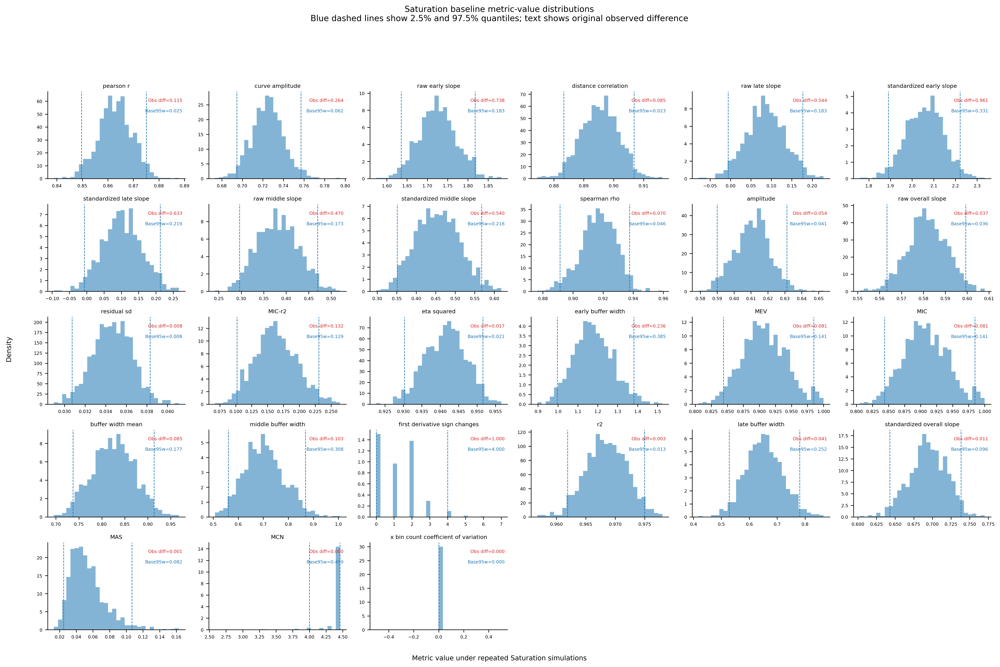

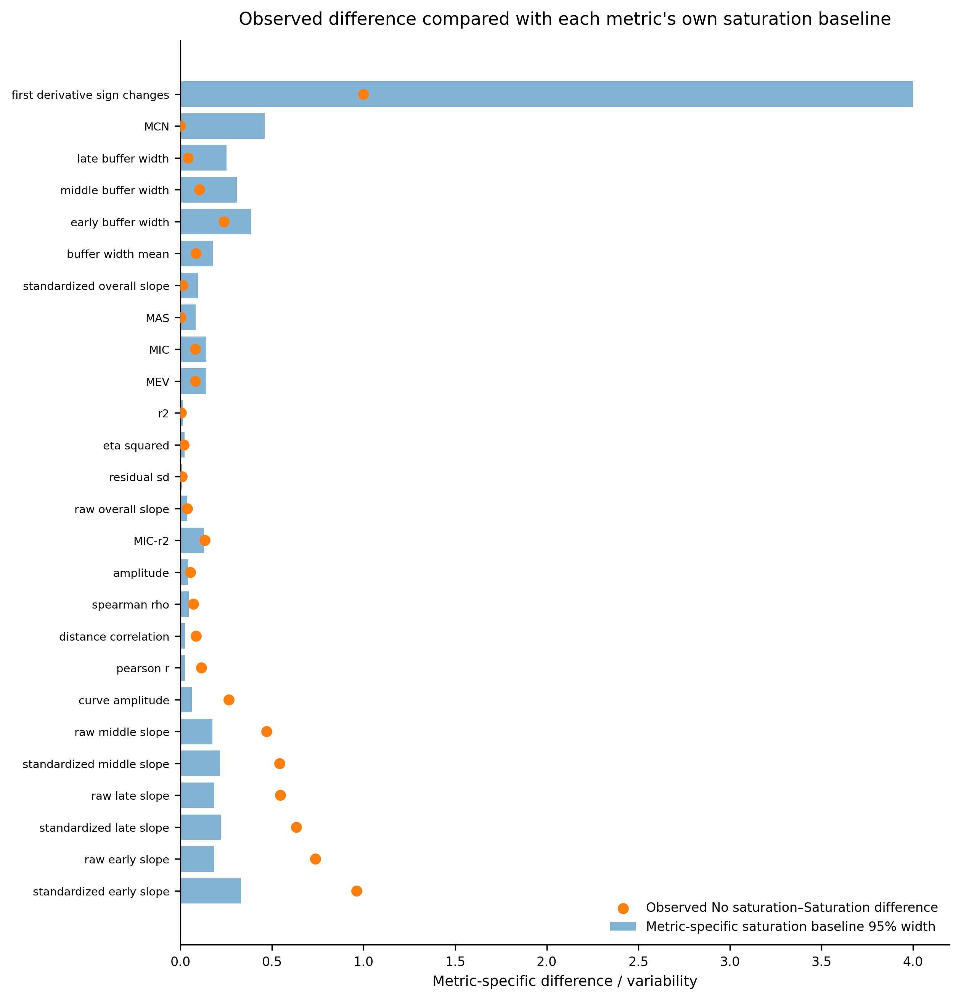

In [2]:
# ==========================================================
# Saturation baseline experiment
# Step 1: repeat Saturation only 1000 times
# Step 2: compare with original No saturation vs Saturation metric difference
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# Optional: MIC / MAS / MEV / MCN
# ==========================================================

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC/MAS/MEV/MCN will be skipped.")


# ==========================================================
# 1. Data generation
# Use your original Saturation / No saturation formulas
# ==========================================================

def generate_saturation_data_original_formula(
    seed,
    n=180,
    noise_sd=0.035,
    x_random=False,
):
    """
    Generate one saturation dataset using the original saturation formula.

    Saturation:
        y = 0.14 + 0.76 * (1 - exp(-4.5 * x))

    Random seed controls:
        1. x positions if x_random=True
        2. random noise around the saturation curve
    """

    rng = np.random.default_rng(seed)

    if x_random:
        x = np.sort(rng.uniform(0, 1, n))
    else:
        x = np.linspace(0, 1, n)

    y_base = 0.14 + 0.76 * (1 - np.exp(-4.5 * x))
    y = y_base + rng.normal(0, noise_sd, n)

    return x, y


def generate_original_no_saturation_and_saturation(
    n=180,
):
    """
    Generate the original deterministic No saturation and Saturation curves.
    This follows your original setting:

    if prop == "Saturation":
        return (
            (xx, 0.14 + 0.76 * xx),
            (xx, 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))),
        )
    """

    xx = np.linspace(0, 1, n)

    x_no_sat = xx
    y_no_sat = 0.14 + 0.76 * xx

    x_sat = xx
    y_sat = 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))

    return x_no_sat, y_no_sat, x_sat, y_sat


# ==========================================================
# 2. Metric helper functions
# ==========================================================

def safe_pearson(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return pearsonr(x, y)[0]


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return spearmanr(x, y)[0]


def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    if len(x) < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


def compute_mine_metrics(x, y):
    empty = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC-r2": np.nan,
    }

    if not HAS_MINEPY:
        return empty

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return empty

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)

    mic = mine.mic()
    mas = mine.mas()
    mev = mine.mev()
    mcn = mine.mcn()

    r = safe_pearson(x, y)
    r2 = r ** 2 if np.isfinite(r) else np.nan

    return {
        "MIC": mic,
        "MAS": mas,
        "MEV": mev,
        "MCN": mcn,
        "MIC-r2": mic - r2 if np.isfinite(r2) else np.nan,
    }


def minmax01(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max):
        return np.full_like(v, np.nan)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def segment_slope_fit(x_seg, y_seg):
    x_seg = np.asarray(x_seg, dtype=float)
    y_seg = np.asarray(y_seg, dtype=float)

    valid = np.isfinite(x_seg) & np.isfinite(y_seg)
    x_seg = x_seg[valid]
    y_seg = y_seg[valid]

    if len(x_seg) < 3 or np.nanstd(x_seg) == 0:
        return np.nan

    return np.polyfit(x_seg, y_seg, 1)[0]


def compute_segment_slopes(x, y, standardized=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 6:
        return np.nan, np.nan, np.nan, np.nan

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    if standardized:
        x = minmax01(x)
        y = minmax01(y)

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = segment_slope_fit(x, y)
    early = segment_slope_fit(x[:i1], y[:i1])
    middle = segment_slope_fit(x[i1:i2], y[i1:i2])
    late = segment_slope_fit(x[i2:], y[i2:])

    return overall, early, middle, late


def compute_x_bin_count_cv(x, n_bins=10):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) == 0:
        return np.nan

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()
    counts = counts.reindex(np.arange(n_bins), fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count


def compute_bin_metrics(x, y, n_bins=10, min_count_per_bin=3):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "amplitude": np.nan,
        "eta squared": np.nan,
        "buffer width mean": np.nan,
        "early buffer width": np.nan,
        "middle buffer width": np.nan,
        "late buffer width": np.nan,
    }

    if len(x) < n_bins:
        return empty_result

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return empty_result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):

        if len(g) < min_count_per_bin:
            continue

        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
            "count": len(g),
        })

    if len(bin_stats) < 3:
        return empty_result

    bin_df = (
        pd.DataFrame(bin_stats)
        .sort_values("x_mean")
        .reset_index(drop=True)
    )

    amplitude = bin_df["y_mean"].max() - bin_df["y_mean"].min()

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_scaled"] = np.nan
    else:
        bin_df["buffer_width_scaled"] = bin_df["buffer_width"] / y_sd

    y_global_mean = df["y"].mean()
    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    eta_squared = ss_between / ss_total if ss_total > 0 else np.nan

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    buffer_mean = bin_df["buffer_width_scaled"].mean()
    buffer_early = bin_df.iloc[:i1]["buffer_width_scaled"].mean()
    buffer_middle = bin_df.iloc[i1:i2]["buffer_width_scaled"].mean()
    buffer_late = bin_df.iloc[i2:]["buffer_width_scaled"].mean()

    return {
        "amplitude": amplitude,
        "eta squared": eta_squared,
        "buffer width mean": buffer_mean,
        "early buffer width": buffer_early,
        "middle buffer width": buffer_middle,
        "late buffer width": buffer_late,
    }


def compute_lowess_metrics(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "residual sd": np.nan,
        "curve amplitude": np.nan,
        "r2": np.nan,
        "first derivative sign changes": np.nan,
    }

    if len(x) < 10:
        return empty_result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    x_fit = fitted[:, 0]
    y_fit = fitted[:, 1]

    y_pred = np.interp(x_sorted, x_fit, y_fit)

    residual = y_sorted - y_pred
    residual_sd = np.nanstd(residual, ddof=1)

    curve_amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)

    ss_res = np.sum((y_sorted - y_pred) ** 2)
    ss_tot = np.sum((y_sorted - np.nanmean(y_sorted)) ** 2)

    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    dx = np.gradient(x_fit)
    dy = np.gradient(y_fit)

    with np.errstate(divide="ignore", invalid="ignore"):
        derivative = dy / dx

    sign = np.sign(derivative)
    sign[sign == 0] = np.nan

    valid_sign = np.isfinite(sign)

    if valid_sign.sum() < 2:
        sign_changes = np.nan
    else:
        sign_valid = sign[valid_sign]
        sign_changes = np.sum(sign_valid[1:] != sign_valid[:-1])

    return {
        "residual sd": residual_sd,
        "curve amplitude": curve_amplitude,
        "r2": r2,
        "first derivative sign changes": sign_changes,
    }


# ==========================================================
# 3. Compute all metrics
# ==========================================================

def compute_all_metrics(x, y):
    metrics = {}

    metrics["pearson r"] = safe_pearson(x, y)
    metrics["spearman rho"] = safe_spearman(x, y)
    metrics["distance correlation"] = distance_correlation(x, y)

    (
        metrics["raw overall slope"],
        metrics["raw early slope"],
        metrics["raw middle slope"],
        metrics["raw late slope"],
    ) = compute_segment_slopes(x, y, standardized=False)

    (
        metrics["standardized overall slope"],
        metrics["standardized early slope"],
        metrics["standardized middle slope"],
        metrics["standardized late slope"],
    ) = compute_segment_slopes(x, y, standardized=True)

    metrics.update(compute_mine_metrics(x, y))

    metrics.update(compute_bin_metrics(x, y))

    metrics["x bin count coefficient of variation"] = compute_x_bin_count_cv(x)

    metrics.update(compute_lowess_metrics(x, y))

    return metrics


# ==========================================================
# 4. Original No saturation vs Saturation results
# Use the table you provided
# ==========================================================

original_metric_values = {
    "pearson r": {
        "No saturation": 0.9857,
        "Saturation": 0.8709,
    },
    "spearman rho": {
        "No saturation": 0.9866,
        "Saturation": 0.9170,
    },
    "distance correlation": {
        "No saturation": 0.9842,
        "Saturation": 0.8992,
    },
    "raw overall slope": {
        "No saturation": 0.7067,
        "Saturation": 0.6693,
    },
    "raw early slope": {
        "No saturation": 0.5978,
        "Saturation": 1.3354,
    },
    "raw middle slope": {
        "No saturation": 0.5066,
        "Saturation": 0.0368,
    },
    "raw late slope": {
        "No saturation": 0.4970,
        "Saturation": -0.0470,
    },
    "standardized overall slope": {
        "No saturation": 0.8169,
        "Saturation": 0.8280,
    },
    "standardized early slope": {
        "No saturation": 0.6910,
        "Saturation": 1.6519,
    },
    "standardized middle slope": {
        "No saturation": 0.5856,
        "Saturation": 0.0455,
    },
    "standardized late slope": {
        "No saturation": 0.5745,
        "Saturation": -0.0582,
    },
    "MIC": {
        "No saturation": 0.9838,
        "Saturation": 0.9027,
    },
    "MAS": {
        "No saturation": 0.0286,
        "Saturation": 0.0294,
    },
    "MEV": {
        "No saturation": 0.9838,
        "Saturation": 0.9027,
    },
    "MCN": {
        "No saturation": 4.3219,
        "Saturation": 4.3219,
    },
    "MIC-r2": {
        "No saturation": 0.0123,
        "Saturation": 0.1443,
    },
    "amplitude": {
        "No saturation": 3.0171,
        "Saturation": 3.0716,
    },
    "eta squared": {
        "No saturation": 0.9604,
        "Saturation": 0.9430,
    },
    "buffer width mean": {
        "No saturation": 0.5739,
        "Saturation": 0.6589,
    },
    "early buffer width": {
        "No saturation": 0.6527,
        "Saturation": 0.8887,
    },
    "middle buffer width": {
        "No saturation": 0.4971,
        "Saturation": 0.5997,
    },
    "late buffer width": {
        "No saturation": 0.5723,
        "Saturation": 0.5309,
    },
    "x bin count coefficient of variation": {
        "No saturation": 0.0000,
        "Saturation": 0.0000,
    },
    "residual sd": {
        "No saturation": 0.1667,
        "Saturation": 0.1745,
    },
    "curve amplitude": {
        "No saturation": 3.3301,
        "Saturation": 3.5946,
    },
    "r2": {
        "No saturation": 0.9722,
        "Saturation": 0.9695,
    },
    "first derivative sign changes": {
        "No saturation": 0.0000,
        "Saturation": 1.0000,
    },
}


original_observed_records = []

for metric, values in original_metric_values.items():
    no_sat_value = values["No saturation"]
    sat_value = values["Saturation"]

    original_observed_records.append({
        "metric": metric,
        "no_saturation_value": no_sat_value,
        "saturation_value": sat_value,
        "observed_difference": abs(sat_value - no_sat_value),
    })

original_observed_df = pd.DataFrame(original_observed_records)


# ==========================================================
# 5. Step 1: Repeat Saturation only
# ==========================================================

n_runs = 1000
noise_sd = 0.035
x_random = False

baseline_records = []

for seed in range(n_runs):

    x_sat, y_sat = generate_saturation_data_original_formula(
        seed=seed,
        n=180,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    metrics = compute_all_metrics(x_sat, y_sat)
    metrics["seed"] = seed

    baseline_records.append(metrics)

baseline_saturation_df = pd.DataFrame(baseline_records)


# ==========================================================
# 6. Baseline summary
# ==========================================================

baseline_summary_records = []

metric_names = [
    c for c in baseline_saturation_df.columns
    if c != "seed"
]

for metric in metric_names:

    values = (
        baseline_saturation_df[metric]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if len(values) == 0:
        continue

    q025 = values.quantile(0.025)
    q975 = values.quantile(0.975)

    baseline_summary_records.append({
        "metric": metric,
        "baseline_mean": values.mean(),
        "baseline_sd": values.std(ddof=1),
        "baseline_min": values.min(),
        "baseline_max": values.max(),
        "baseline_range": values.max() - values.min(),
        "baseline_q025": q025,
        "baseline_q975": q975,
        "baseline_95_width": q975 - q025,
    })

baseline_summary_df = pd.DataFrame(baseline_summary_records)


# ==========================================================
# 7. Compare original observed difference with saturation baseline
# ==========================================================

comparison_df = original_observed_df.merge(
    baseline_summary_df,
    on="metric",
    how="left",
)

comparison_df["ratio_to_baseline_95_width"] = (
    comparison_df["observed_difference"]
    / comparison_df["baseline_95_width"]
)

comparison_df["ratio_to_baseline_sd"] = (
    comparison_df["observed_difference"]
    / comparison_df["baseline_sd"]
)

comparison_df["larger_than_baseline_95_width"] = (
    comparison_df["observed_difference"]
    > comparison_df["baseline_95_width"]
)

comparison_df["larger_than_baseline_range"] = (
    comparison_df["observed_difference"]
    > comparison_df["baseline_range"]
)

comparison_df = comparison_df.sort_values(
    "ratio_to_baseline_95_width",
    ascending=False,
).reset_index(drop=True)

display(comparison_df)


# ==========================================================
# 8. Plot: observed difference vs saturation baseline variability
# ==========================================================

# plot_df = comparison_df.copy()
# plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
# plot_df = plot_df.dropna(subset=["ratio_to_baseline_95_width"])

# plot_df = plot_df.sort_values(
#     "ratio_to_baseline_95_width",
#     ascending=True,
# )

# fig, ax = plt.subplots(
#     figsize=(8.5, max(6, 0.32 * len(plot_df))),
#     dpi=300,
# )

# y_pos = np.arange(len(plot_df))

# ax.barh(
#     y_pos,
#     plot_df["ratio_to_baseline_95_width"],
#     alpha=0.85,
# )

# ax.axvline(
#     1,
#     linestyle="--",
#     linewidth=1.2,
#     alpha=0.85,
# )

# ax.text(
#     1.02,
#     len(plot_df) - 0.5,
#     "observed difference = baseline 95% width",
#     fontsize=8,
#     va="top",
# )

# ax.set_yticks(y_pos)
# ax.set_yticklabels(
#     plot_df["metric"],
#     fontsize=7,
# )

# ax.set_xlabel(
#     "Observed No saturation–Saturation difference / Saturation baseline 95% width",
#     fontsize=9,
# )

# ax.set_title(
#     "Does the original Saturation–No saturation difference exceed Saturation baseline variability?",
#     fontsize=11,
#     pad=10,
# )

# ax.tick_params(axis="x", labelsize=8)

# for spine in ["top", "right"]:
#     ax.spines[spine].set_visible(False)

# plt.tight_layout()
# plt.show()


# ==========================================================
# 9. Plot: baseline distributions with observed difference markers
# ==========================================================

n_cols = 6
top_k = None

plot_metrics = comparison_df["metric"].tolist()

if top_k is not None:
    plot_metrics = plot_metrics[:top_k]

n_metrics = len(plot_metrics)
n_rows = math.ceil(n_metrics / n_cols)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3.1 * n_cols, 2.35 * n_rows),
    dpi=300,
)

axes = np.asarray(axes).reshape(-1)

baseline_color = "tab:blue"
observed_color = "tab:red"

for ax_idx, metric in enumerate(plot_metrics):

    ax = axes[ax_idx]

    baseline_values = (
        baseline_saturation_df[metric]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    observed_diff = comparison_df.loc[
        comparison_df["metric"] == metric,
        "observed_difference"
    ].values[0]

    baseline_width = comparison_df.loc[
        comparison_df["metric"] == metric,
        "baseline_95_width"
    ].values[0]

    if len(baseline_values) < 5:
        ax.set_title(f"{metric}\nno valid values", fontsize=7)
        ax.axis("off")
        continue

    ax.hist(
        baseline_values,
        bins=30,
        alpha=0.55,
        color=baseline_color,
        density=True,
        label="Saturation baseline metric values" if ax_idx == 0 else None,
    )

    q025 = np.nanquantile(baseline_values, 0.025)
    q975 = np.nanquantile(baseline_values, 0.975)

    ax.axvline(
        q025,
        color=baseline_color,
        linestyle="--",
        linewidth=0.8,
    )

    ax.axvline(
        q975,
        color=baseline_color,
        linestyle="--",
        linewidth=0.8,
    )

    ax.text(
        0.98,
        0.92,
        f"Obs diff={observed_diff:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
        color=observed_color,
    )

    ax.text(
        0.98,
        0.80,
        f"Base95w={baseline_width:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
        color=baseline_color,
    )

    ax.set_title(
        metric,
        fontsize=7.5,
        pad=5,
    )

    ax.tick_params(axis="both", labelsize=6)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

for j in range(n_metrics, len(axes)):
    axes[j].axis("off")

fig.suptitle(
    "Saturation baseline metric-value distributions\n"
    "Blue dashed lines show 2.5% and 97.5% quantiles; text shows original observed difference",
    fontsize=11,
    y=1.04,
)

fig.text(
    0.5,
    0.01,
    "Metric value under repeated Saturation simulations",
    ha="center",
    fontsize=9,
)

fig.text(
    0.01,
    0.5,
    "Density",
    va="center",
    rotation="vertical",
    fontsize=9,
)

plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
plt.show()

# ==========================================================
# Plot: each metric has its own baseline
# Blue bar = baseline 95% width for this metric
# Red point = observed No saturation–Saturation difference
# ==========================================================

plot_df = comparison_df.copy()

plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
plot_df = plot_df.dropna(
    subset=[
        "baseline_95_width",
        "observed_difference",
        "ratio_to_baseline_95_width",
    ]
)

# plot_df = plot_df.sort_values(
#     "observed_difference",
#     ascending=False
# ).reset_index(drop=True)

plot_df["observed_minus_baseline95"] = (
        plot_df["observed_difference"] - plot_df["baseline_95_width"]
    )

    # Sort from large to small
plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False
    ).reset_index(drop=True)


fig, ax = plt.subplots(
    figsize=(8.5, max(6, 0.34 * len(plot_df))),
    dpi=300,
)

y_pos = np.arange(len(plot_df))

# Each metric's own baseline width
ax.barh(
    y_pos,
    plot_df["baseline_95_width"],
    alpha=0.55,
    label="Metric-specific saturation baseline 95% width",
)

# Each metric's observed difference
ax.scatter(
    plot_df["observed_difference"],
    y_pos,
    s=35,
    zorder=3,
    label="Observed No saturation–Saturation difference",
)

ax.set_yticks(y_pos)
ax.set_yticklabels(
    plot_df["metric"],
    fontsize=7,
)

ax.set_xlabel(
    "Metric-specific difference / variability",
    fontsize=9,
)

ax.set_title(
    "Observed difference compared with each metric's own saturation baseline",
    fontsize=11,
    pad=10,
)

ax.legend(
    frameon=False,
    fontsize=8,
    loc="lower right",
)

ax.tick_params(axis="x", labelsize=8)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

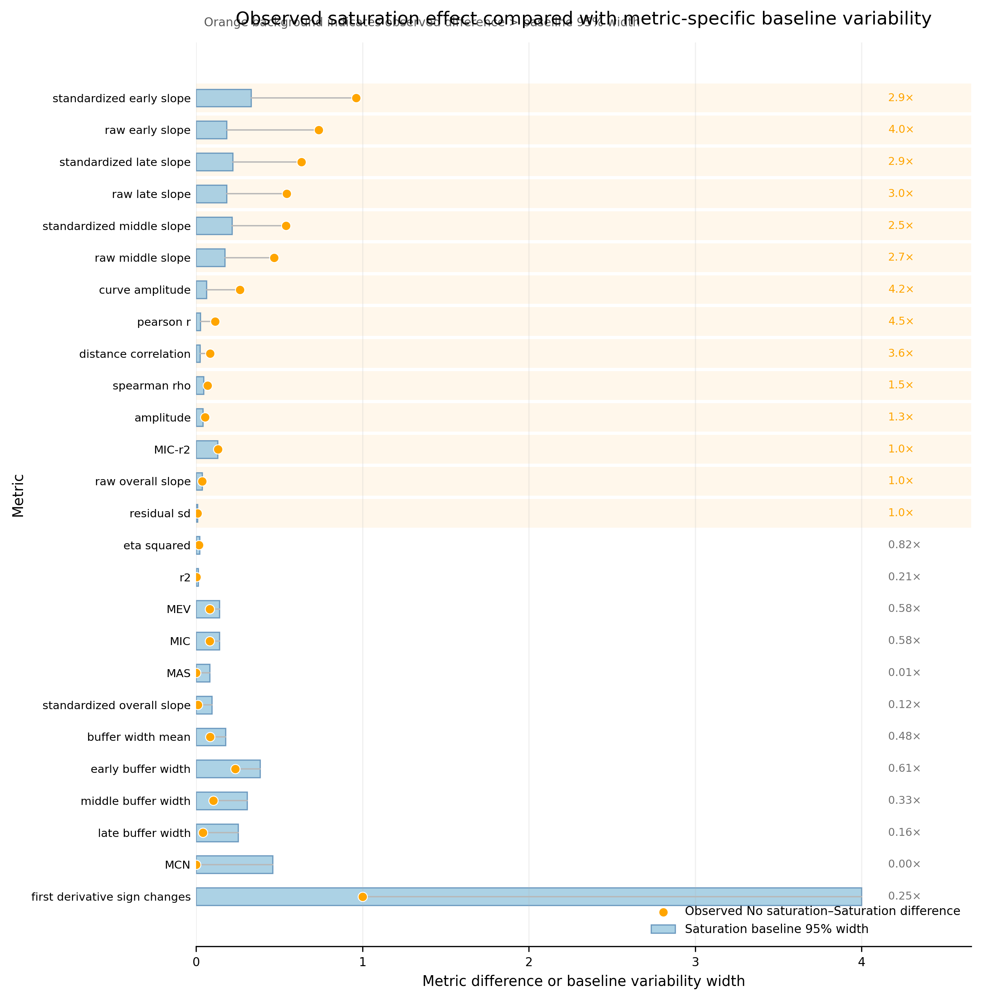

In [3]:
# ==========================================================
# Publication-style plot:
# Blue bar = metric-specific baseline 95% width
# Orange point = observed No saturation–Saturation difference
# Grey connector = gap between baseline width and observed difference
# ==========================================================

import numpy as np
import matplotlib.pyplot as plt

plot_df = comparison_df.copy()

plot_df = plot_df.replace([np.inf, -np.inf], np.nan)

plot_df = plot_df.dropna(
    subset=[
        "baseline_95_width",
        "observed_difference",
        "ratio_to_baseline_95_width",
    ]
)

# Sort by observed No saturation–Saturation difference:
# Difference between observed effect and 1000-run baseline variability
# Positive value means observed difference is larger than baseline 95% width
plot_df["observed_minus_baseline95"] = (
    plot_df["observed_difference"] - plot_df["baseline_95_width"]
)

# Sort from large to small
plot_df = plot_df.sort_values(
    "observed_minus_baseline95",
    ascending=False
).reset_index(drop=True)


# Whether observed difference exceeds baseline variability
plot_df["exceeds_baseline"] = (
    plot_df["observed_difference"] > plot_df["baseline_95_width"]
)

n_metrics = len(plot_df)
y_pos = np.arange(n_metrics)

fig, ax = plt.subplots(
    figsize=(9.2, max(6.5, 0.36 * n_metrics)),
    dpi=300,
)

# ----------------------------------------------------------
# Light background for metrics where observed > baseline
# ----------------------------------------------------------

for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
    if exceeds:
        ax.axhspan(
            i - 0.45,
            i + 0.45,
            alpha=0.08,
            color="orange",
            linewidth=0,
        )

# ----------------------------------------------------------
# Baseline 95% width bars
# ----------------------------------------------------------

ax.barh(
    y_pos,
    plot_df["baseline_95_width"],
    height=0.55,
    color="#9ecae1",
    edgecolor="#5b8db8",
    linewidth=0.8,
    alpha=0.85,
    label="Saturation baseline 95% width",
)

# ----------------------------------------------------------
# Connector lines between baseline width and observed difference
# ----------------------------------------------------------

for i, row in plot_df.iterrows():

    x1 = row["baseline_95_width"]
    x2 = row["observed_difference"]

    ax.plot(
        [x1, x2],
        [i, i],
        color="0.72",
        linewidth=0.9,
        zorder=2,
    )

# ----------------------------------------------------------
# Observed difference points
# ----------------------------------------------------------

ax.scatter(
    plot_df["observed_difference"],
    y_pos,
    s=38,
    color="orange",
    edgecolor="white",
    linewidth=0.6,
    zorder=4,
    label="Observed No saturation–Saturation difference",
)

# ----------------------------------------------------------
# Add ratio labels
# ----------------------------------------------------------

x_max = np.nanmax([
    plot_df["baseline_95_width"].max(),
    plot_df["observed_difference"].max(),
])

x_text = x_max * 1.04

for i, row in plot_df.iterrows():

    ratio = row["ratio_to_baseline_95_width"]

    if ratio >= 1:
        label = f"{ratio:.1f}×"
        color = "orange"
    else:
        label = f"{ratio:.2f}×"
        color = "0.45"

    ax.text(
        x_text,
        i,
        label,
        va="center",
        ha="left",
        fontsize=7.2,
        color=color,
    )

# ----------------------------------------------------------
# Axis labels and title
# ----------------------------------------------------------

ax.set_yticks(y_pos)
ax.set_yticklabels(
    plot_df["metric"],
    fontsize=7.5,
)

ax.invert_yaxis()

ax.set_xlabel(
    "Metric difference or baseline variability width",
    fontsize=9.5,
)

ax.set_ylabel(
    "Metric",
    fontsize=9.5,
)

ax.set_title(
    "Observed saturation effect compared with metric-specific baseline variability",
    fontsize=12,
    pad=12,
)

# ----------------------------------------------------------
# Add explanation text
# ----------------------------------------------------------

ax.text(
    0.01,
    1.015,
    "Orange background indicates observed difference > baseline 95% width",
    transform=ax.transAxes,
    ha="left",
    va="bottom",
    fontsize=8,
    color="0.35",
)

# ----------------------------------------------------------
# Appearance
# ----------------------------------------------------------

ax.grid(
    axis="x",
    alpha=0.18,
    linewidth=0.8,
)

ax.tick_params(
    axis="x",
    labelsize=8,
)

ax.tick_params(
    axis="y",
    length=0,
)

for spine in ["top", "right", "left"]:
    ax.spines[spine].set_visible(False)

ax.legend(
    frameon=False,
    fontsize=8,
    loc="lower right",
)

ax.set_xlim(
    0,
    x_text * 1.12,
)

plt.tight_layout()
plt.show()

In [4]:
# ==========================================================
# General baseline experiment for all response properties
# Logic:
#   For each property:
#   Step 1. Generate original paired cases: case A vs case B
#   Step 2. observed_difference = |metric_B - metric_A|
#   Step 3. Repeat target case B 1000 times with random noise
#   Step 4. baseline_95_width = q97.5 - q2.5 of metric values
#   Step 5. ratio = observed_difference / baseline_95_width
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math


# ==========================================================
# 1. Property generators
# ==========================================================

def generate_property_pair_original(
    property_name,
    n=180,
):
    """
    Generate the original paired datasets for each property.
    These are deterministic curves without random noise.

    Return:
        x_a, y_a, x_b, y_b, case_a_name, case_b_name
    """

    x = np.linspace(0, 1, n)

    if property_name == "Direction":
        y_a = 0.18 + 0.68 * x
        y_b = 0.86 - 0.68 * x
        return x, y_a, x, y_b, "Positive direction", "Negative direction"

    elif property_name == "Monotonicity":
        y_a = 0.16 + 0.70 * x
        y_b = 0.48 + 0.30 * np.sin(2.5 * np.pi * x)
        return x, y_a, x, y_b, "Monotonic", "Non-monotonic"

    elif property_name == "Strength":
        y_a = 0.30 + 0.32 * x
        y_b = 0.30 + 0.70 * x
        return x, y_a, x, y_b, "Weak response", "Strong response"

    elif property_name == "Non-linearity":
        y_a = 0.14 + 0.76 * x
        y_b = 0.14 + 0.76 * (x ** 2)
        return x, y_a, x, y_b, "Linear", "Non-linear"

    elif property_name == "Convexity / Concavity":
        y_a = 0.14 + 0.76 * (x ** 2)
        y_b = 0.14 + 0.76 * np.sqrt(x)
        return x, y_a, x, y_b, "Convex", "Concave"

    elif property_name == "Saturation":
        y_a = 0.14 + 0.76 * x
        y_b = 0.14 + 0.76 * (1 - np.exp(-4.5 * x))
        return x, y_a, x, y_b, "No saturation", "Saturation"

    elif property_name == "Turning point":
        y_a = 0.14 + 0.76 * x
        y_b = 0.78 - 1.10 * (x - 0.52) ** 2
        return x, y_a, x, y_b, "No turning point", "Turning point"

    elif property_name == "Threshold":
        y_a = 0.18 + 0.62 * x
        y_b = np.where(
            x < 0.48,
            0.26 + 0.15 * x,
            0.33 + 0.95 * (x - 0.48)
        )
        return x, y_a, x, y_b, "No threshold", "Threshold-like"

    elif property_name == "Spread":
        y_a = 0.20 + 0.62 * x
        y_b = 0.20 + 0.62 * x
        return x, y_a, x, y_b, "Low spread", "High spread"

    elif property_name == "Heteroscedasticity":
        y_a = 0.20 + 0.62 * x
        y_b = 0.20 + 0.62 * x
        return x, y_a, x, y_b, "Constant variance", "Changing variance"

    elif property_name == "Density":
        x_a = np.linspace(0, 1, n)
        y_a = 0.20 + 0.62 * x_a

        n1 = int(n * 0.65)
        n2 = n - n1
        x_b = np.concatenate([
            np.linspace(0.02, 0.34, n1),
            np.linspace(0.34, 0.98, n2),
        ])
        y_b = 0.20 + 0.62 * x_b

        return x_a, y_a, x_b, y_b, "Even coverage", "Uneven coverage"

    elif property_name == "Clustering":
        x_a = np.linspace(0, 1, n)
        y_a = 0.20 + 0.62 * x_a

        centers = np.array([0.20, 0.52, 0.82])
        sizes = [n // 3, n // 3, n - 2 * (n // 3)]
        x_b = np.concatenate([
            np.full(sizes[0], centers[0]),
            np.full(sizes[1], centers[1]),
            np.full(sizes[2], centers[2]),
        ])
        x_b = np.sort(x_b)
        y_b = 0.20 + 0.62 * x_b

        return x_a, y_a, x_b, y_b, "Single cloud", "Separated clusters"

    elif property_name == "Certainty":
        y_a = 0.20 + 0.62 * x
        y_b = 0.20 + 0.62 * x
        return x, y_a, x, y_b, "High certainty", "Low certainty"

    else:
        raise ValueError(f"Unknown property_name: {property_name}")


def generate_property_target_case_random(
    property_name,
    seed,
    n=180,
    base_noise_sd=0.035,
):
    """
    Generate the target case B repeatedly.
    This is used to estimate baseline variability under fixed target property.

    Return:
        x, y
    """

    rng = np.random.default_rng(seed)

    x_a, y_a, x_b, y_b, case_a_name, case_b_name = generate_property_pair_original(
        property_name=property_name,
        n=n,
    )

    x = np.asarray(x_b, dtype=float)
    y_base = np.asarray(y_b, dtype=float)

    # ------------------------------------------------------
    # Property-specific noise settings
    # ------------------------------------------------------

    if property_name == "Spread":
        # High spread target case
        noise = rng.normal(0, 0.12, len(x))

    elif property_name == "Heteroscedasticity":
        # Changing variance target case
        noise_sd = 0.025 + 0.18 * x
        noise = rng.normal(0, noise_sd, len(x))

    elif property_name == "Certainty":
        # Low certainty target case
        noise = rng.normal(0, 0.13, len(x))

    elif property_name == "Density":
        # Keep uneven density structure, add random noise only
        noise = rng.normal(0, base_noise_sd, len(x))

    elif property_name == "Clustering":
        # Add small random perturbation to clustered x positions
        x = x + rng.normal(0, 0.025, len(x))
        x = np.clip(x, 0, 1)
        x = np.sort(x)
        y_base = 0.20 + 0.62 * x
        noise = rng.normal(0, base_noise_sd, len(x))

    else:
        noise = rng.normal(0, base_noise_sd, len(x))

    y = y_base + noise

    return x, y


def add_original_noise_for_pair(
    property_name,
    x_a,
    y_a,
    x_b,
    y_b,
    seed=88,
    base_noise_sd=0.035,
):
    """
    Add one fixed random noise realization to the original pair.
    This makes the original pair closer to the scatterplot-based metric setting.

    If you want completely deterministic original curves, set add_noise=False
    in run_property_baseline_experiment().
    """

    rng = np.random.default_rng(seed)

    x_a = np.asarray(x_a, dtype=float)
    y_a = np.asarray(y_a, dtype=float)
    x_b = np.asarray(x_b, dtype=float)
    y_b = np.asarray(y_b, dtype=float)

    # Case A noise
    if property_name in ["Spread", "Heteroscedasticity", "Certainty"]:
        noise_a = rng.normal(0, base_noise_sd, len(x_a))
    else:
        noise_a = rng.normal(0, base_noise_sd, len(x_a))

    # Case B noise
    if property_name == "Spread":
        noise_b = rng.normal(0, 0.12, len(x_b))

    elif property_name == "Heteroscedasticity":
        noise_sd_b = 0.025 + 0.18 * x_b
        noise_b = rng.normal(0, noise_sd_b, len(x_b))

    elif property_name == "Certainty":
        noise_b = rng.normal(0, 0.13, len(x_b))

    else:
        noise_b = rng.normal(0, base_noise_sd, len(x_b))

    return x_a, y_a + noise_a, x_b, y_b + noise_b


# ==========================================================
# 2. Run baseline experiment for one property
# ==========================================================

def run_property_baseline_experiment(
    property_name,
    n_runs=1000,
    n=180,
    base_noise_sd=0.035,
    original_seed=88,
    add_noise_to_original_pair=True,
):
    """
    Run baseline variability experiment for one property.

    Output:
        result = {
            "property_name": property_name,
            "case_a_name": case_a_name,
            "case_b_name": case_b_name,
            "original_metric_df": original_metric_df,
            "baseline_metric_df": baseline_metric_df,
            "comparison_df": comparison_df,
        }
    """

    # ------------------------------------------------------
    # Step 1. Original paired cases
    # ------------------------------------------------------

    x_a, y_a, x_b, y_b, case_a_name, case_b_name = generate_property_pair_original(
        property_name=property_name,
        n=n,
    )

    if add_noise_to_original_pair:
        x_a, y_a, x_b, y_b = add_original_noise_for_pair(
            property_name=property_name,
            x_a=x_a,
            y_a=y_a,
            x_b=x_b,
            y_b=y_b,
            seed=original_seed,
            base_noise_sd=base_noise_sd,
        )

    metrics_a = compute_all_metrics(x_a, y_a)
    metrics_b = compute_all_metrics(x_b, y_b)

    original_records = []

    all_metric_names = sorted(
        set(metrics_a.keys()).intersection(set(metrics_b.keys()))
    )

    for metric in all_metric_names:

        value_a = metrics_a.get(metric, np.nan)
        value_b = metrics_b.get(metric, np.nan)

        if not np.isfinite(value_a) or not np.isfinite(value_b):
            continue

        original_records.append({
            "property": property_name,
            "case_a": case_a_name,
            "case_b": case_b_name,
            "metric": metric,
            "case_a_value": value_a,
            "case_b_value": value_b,
            "observed_difference": abs(value_b - value_a),
        })

    original_metric_df = pd.DataFrame(original_records)

    # ------------------------------------------------------
    # Step 2. Repeat target case B 1000 times
    # ------------------------------------------------------

    baseline_records = []

    for seed in range(n_runs):

        x_target, y_target = generate_property_target_case_random(
            property_name=property_name,
            seed=seed,
            n=n,
            base_noise_sd=base_noise_sd,
        )

        metrics = compute_all_metrics(x_target, y_target)
        metrics["seed"] = seed

        baseline_records.append(metrics)

    baseline_metric_df = pd.DataFrame(baseline_records)

    # ------------------------------------------------------
    # Step 3. Baseline summary
    # ------------------------------------------------------

    baseline_summary_records = []

    metric_names = [
        c for c in baseline_metric_df.columns
        if c != "seed"
    ]

    for metric in metric_names:

        values = (
            baseline_metric_df[metric]
            .replace([np.inf, -np.inf], np.nan)
            .dropna()
        )

        if len(values) == 0:
            continue

        q025 = values.quantile(0.025)
        q975 = values.quantile(0.975)

        baseline_summary_records.append({
            "property": property_name,
            "metric": metric,
            "baseline_mean": values.mean(),
            "baseline_sd": values.std(ddof=1),
            "baseline_min": values.min(),
            "baseline_max": values.max(),
            "baseline_q025": q025,
            "baseline_q975": q975,
            "baseline_95_width": q975 - q025,
            "baseline_range": values.max() - values.min(),
        })

    baseline_summary_df = pd.DataFrame(baseline_summary_records)

    # ------------------------------------------------------
    # Step 4. Compare observed difference with baseline width
    # ------------------------------------------------------

    comparison_df = original_metric_df.merge(
        baseline_summary_df,
        on=["property", "metric"],
        how="left",
    )

    comparison_df["ratio_to_baseline_95_width"] = (
        comparison_df["observed_difference"]
        / comparison_df["baseline_95_width"]
    )

    comparison_df["ratio_to_baseline_sd"] = (
        comparison_df["observed_difference"]
        / comparison_df["baseline_sd"]
    )

    comparison_df["larger_than_baseline_95_width"] = (
        comparison_df["observed_difference"]
        > comparison_df["baseline_95_width"]
    )

    comparison_df["larger_than_baseline_range"] = (
        comparison_df["observed_difference"]
        > comparison_df["baseline_range"]
    )

    comparison_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    comparison_df = comparison_df.sort_values(
        "observed_difference",
        ascending=False,
    ).reset_index(drop=True)

    return {
        "property_name": property_name,
        "case_a_name": case_a_name,
        "case_b_name": case_b_name,
        "original_metric_df": original_metric_df,
        "baseline_metric_df": baseline_metric_df,
        "baseline_summary_df": baseline_summary_df,
        "comparison_df": comparison_df,
    }


# ==========================================================
# 3. Run all properties
# ==========================================================

properties_to_run = [
    "Direction",
    "Monotonicity",
    "Strength",
    "Non-linearity",
    "Convexity / Concavity",
    "Saturation",
    "Turning point",
    "Threshold",
    "Spread",
    "Heteroscedasticity",
    "Density",
    "Clustering",
    "Certainty",
]

all_property_results = {}

for property_name in properties_to_run:

    print(f"Running property: {property_name}")

    result = run_property_baseline_experiment(
        property_name=property_name,
        n_runs=1000,
        n=180,
        base_noise_sd=0.035,
        original_seed=88,
        add_noise_to_original_pair=True,
    )

    all_property_results[property_name] = result

print("Finished all properties.")

Running property: Direction
Running property: Monotonicity
Running property: Strength
Running property: Non-linearity
Running property: Convexity / Concavity
Running property: Saturation
Running property: Turning point
Running property: Threshold
Running property: Spread
Running property: Heteroscedasticity
Running property: Density
Running property: Clustering


/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_74475/610085409.py:216: RankWarning: Polyfit may be poorly conditioned
  return np.polyfit(x_seg, y_seg, 1)[0]
/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_74475/610085409.py:216: RankWarning: Polyfit may be poorly conditioned
  return np.polyfit(x_seg, y_seg, 1)[0]
/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_74475/610085409.py:216: RankWarning: Polyfit may be poorly conditioned
  return np.polyfit(x_seg, y_seg, 1)[0]
/Users/mimi/miniconda3/envs/pip39/lib/python3.9/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


Running property: Certainty
Finished all properties.


In [5]:
# ==========================================================
# Save all property baseline results to tables
# ==========================================================

import os
import pandas as pd

output_dir = "./property_baseline_outputs"
os.makedirs(output_dir, exist_ok=True)


# ----------------------------------------------------------
# 1. Save each property's comparison table separately
# ----------------------------------------------------------

for property_name, result in all_property_results.items():

    safe_name = (
        property_name
        .replace("/", "_")
        .replace(" ", "_")
        .replace("-", "_")
    )

    comparison_df = result["comparison_df"].copy()

    # Optional: add observed - baseline 95% width
    comparison_df["observed_minus_baseline95"] = (
        comparison_df["observed_difference"]
        - comparison_df["baseline_95_width"]
    )

    comparison_df = comparison_df.sort_values(
        "observed_minus_baseline95",
        ascending=False
    ).reset_index(drop=True)

    comparison_df.to_csv(
        os.path.join(output_dir, f"{safe_name}_comparison.csv"),
        index=False,
        encoding="utf-8-sig"
    )


# ----------------------------------------------------------
# 2. Merge all properties into one long table
# ----------------------------------------------------------

all_comparison_records = []

for property_name, result in all_property_results.items():

    comparison_df = result["comparison_df"].copy()

    comparison_df["property"] = property_name
    comparison_df["case_a"] = result["case_a_name"]
    comparison_df["case_b"] = result["case_b_name"]

    comparison_df["observed_minus_baseline95"] = (
        comparison_df["observed_difference"]
        - comparison_df["baseline_95_width"]
    )

    all_comparison_records.append(comparison_df)

all_comparison_df = pd.concat(
    all_comparison_records,
    ignore_index=True
)

all_comparison_df = all_comparison_df.sort_values(
    ["property", "observed_minus_baseline95"],
    ascending=[True, False]
).reset_index(drop=True)

all_comparison_df.to_csv(
    os.path.join(output_dir, "all_properties_comparison_long.csv"),
    index=False,
    encoding="utf-8-sig"
)


# ----------------------------------------------------------
# 3. Save fingerprint matrix
# Value = observed_difference / baseline_95_width
# ----------------------------------------------------------

fingerprint_matrix = all_comparison_df.pivot_table(
    index="property",
    columns="metric",
    values="ratio_to_baseline_95_width",
    aggfunc="mean"
)

fingerprint_matrix.to_csv(
    os.path.join(output_dir, "property_metric_fingerprint_matrix_ratio.csv"),
    encoding="utf-8-sig"
)


# ----------------------------------------------------------
# 4. Save observed-minus-baseline matrix
# Value = observed_difference - baseline_95_width
# ----------------------------------------------------------

observed_minus_baseline_matrix = all_comparison_df.pivot_table(
    index="property",
    columns="metric",
    values="observed_minus_baseline95",
    aggfunc="mean"
)

observed_minus_baseline_matrix.to_csv(
    os.path.join(output_dir, "property_metric_observed_minus_baseline95_matrix.csv"),
    encoding="utf-8-sig"
)


# ----------------------------------------------------------
# 5. Save everything into one Excel file
# ----------------------------------------------------------

excel_path = os.path.join(
    output_dir,
    "property_baseline_experiment_results.xlsx"
)

with pd.ExcelWriter(excel_path, engine="openpyxl") as writer:

    all_comparison_df.to_excel(
        writer,
        sheet_name="all_comparison_long",
        index=False
    )

    fingerprint_matrix.to_excel(
        writer,
        sheet_name="fingerprint_ratio"
    )

    observed_minus_baseline_matrix.to_excel(
        writer,
        sheet_name="obs_minus_baseline"
    )

    # Save each property as a separate sheet
    for property_name, result in all_property_results.items():

        safe_sheet_name = (
            property_name
            .replace("/", "_")
            .replace(" ", "_")
            .replace("-", "_")
        )

        # Excel sheet names must be <= 31 characters
        safe_sheet_name = safe_sheet_name[:31]

        df = result["comparison_df"].copy()

        df["observed_minus_baseline95"] = (
            df["observed_difference"]
            - df["baseline_95_width"]
        )

        df = df.sort_values(
            "observed_minus_baseline95",
            ascending=False
        ).reset_index(drop=True)

        df.to_excel(
            writer,
            sheet_name=safe_sheet_name,
            index=False
        )

print(f"Saved results to: {output_dir}")
print(f"Excel file: {excel_path}")

Saved results to: ./property_baseline_outputs
Excel file: ./property_baseline_outputs/property_baseline_experiment_results.xlsx


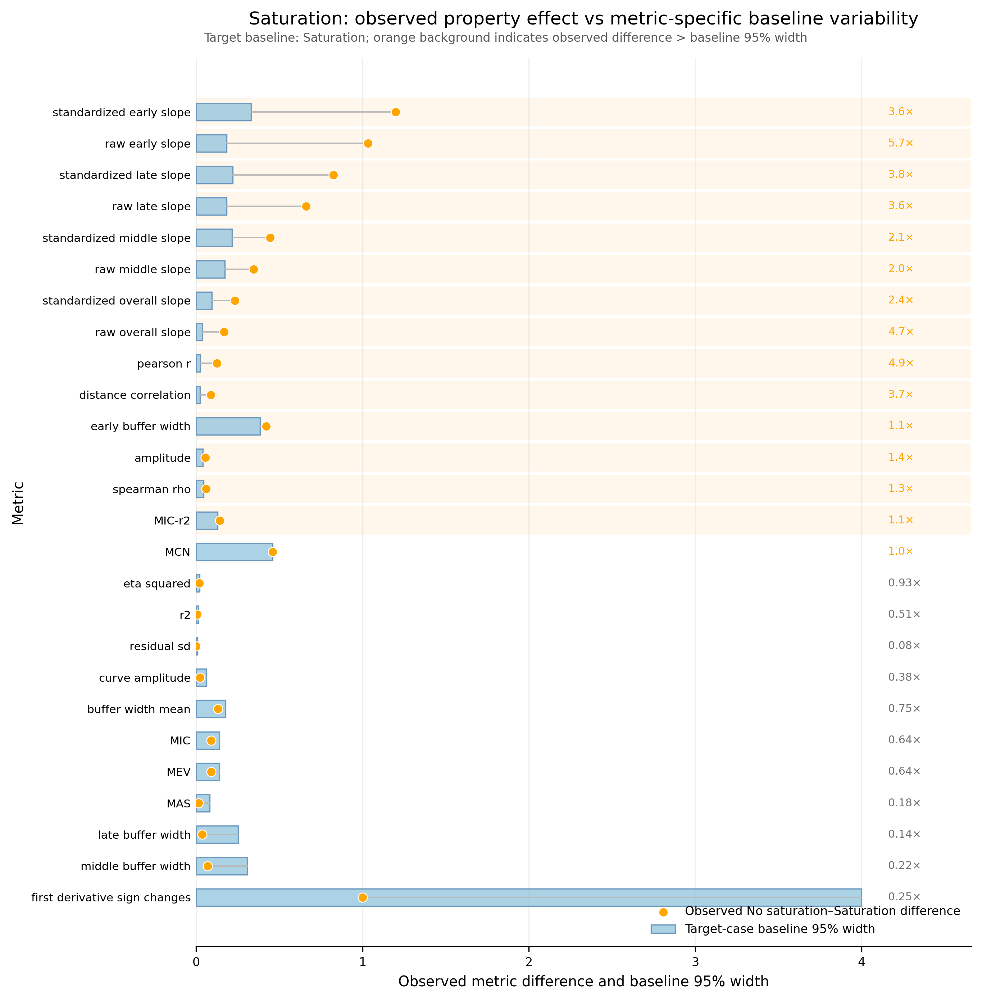

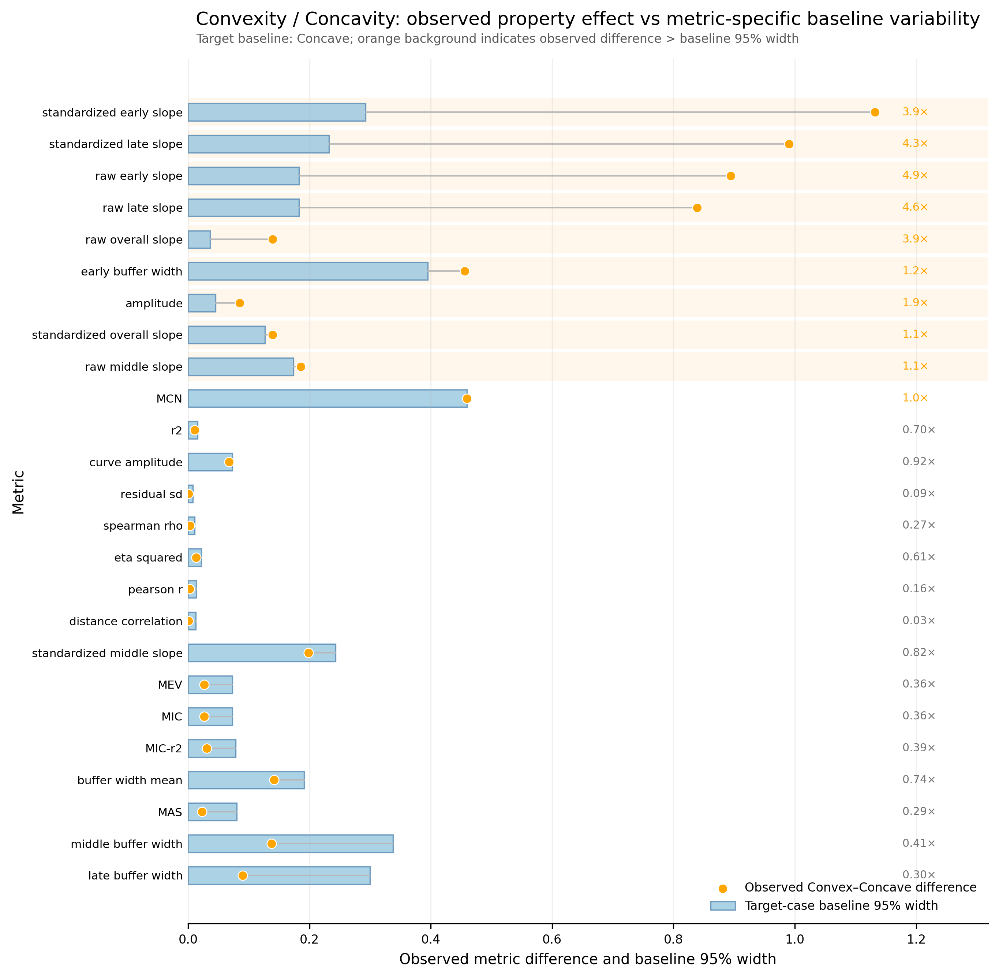

In [6]:
# ==========================================================
# Plot one property:
# Raw scale
# Blue bar = baseline 95% width
# Orange point = observed difference
# Sorted by observed_difference from large to small
# ==========================================================

def plot_property_baseline_raw(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
):
    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a = result["case_a_name"]
    case_b = result["case_b_name"]

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
            "ratio_to_baseline_95_width",
        ]
    )

    # Positive value means observed difference is larger than baseline 95% width
    plot_df["observed_minus_baseline95"] = (
        plot_df["observed_difference"] - plot_df["baseline_95_width"]
    )

    # Sort from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False
    ).reset_index(drop=True)


    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_difference"] > plot_df["baseline_95_width"]
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Background highlight
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Baseline bars
    ax.barh(
        y_pos,
        plot_df["baseline_95_width"],
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="Target-case baseline 95% width",
    )

    # Connectors
    for i, row in plot_df.iterrows():

        ax.plot(
            [row["baseline_95_width"], row["observed_difference"]],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Observed points
    ax.scatter(
        plot_df["observed_difference"],
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label=f"Observed {case_a}–{case_b} difference",
    )

    # Ratio labels
    x_max = np.nanmax([
        plot_df["baseline_95_width"].max(),
        plot_df["observed_difference"].max(),
    ])

    x_text = x_max * 1.04 if x_max > 0 else 1

    for i, row in plot_df.iterrows():

        ratio = row["ratio_to_baseline_95_width"]

        if ratio >= 1:
            label = f"{ratio:.1f}×"
            color = "orange"
        else:
            label = f"{ratio:.2f}×"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed metric difference and baseline 95% width",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: observed property effect vs metric-specific baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target baseline: {case_b}; orange background indicates observed difference > baseline 95% width",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()
    plt.show()
plot_property_baseline_raw(
    property_name="Saturation",
    all_property_results=all_property_results,
    top_k=None,
)

plot_property_baseline_raw(
    property_name="Convexity / Concavity",
    all_property_results=all_property_results,
    top_k=None,
)

Plotting raw figure: Direction


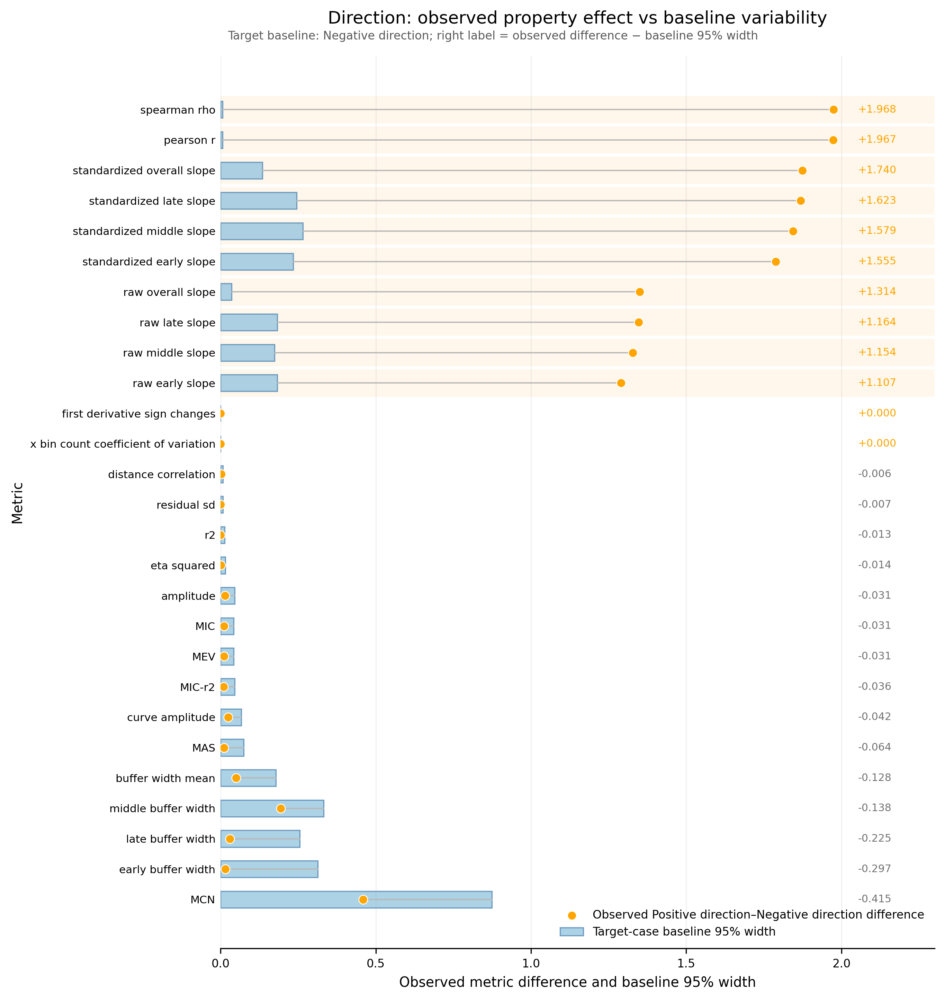

Plotting normalized figure: Direction


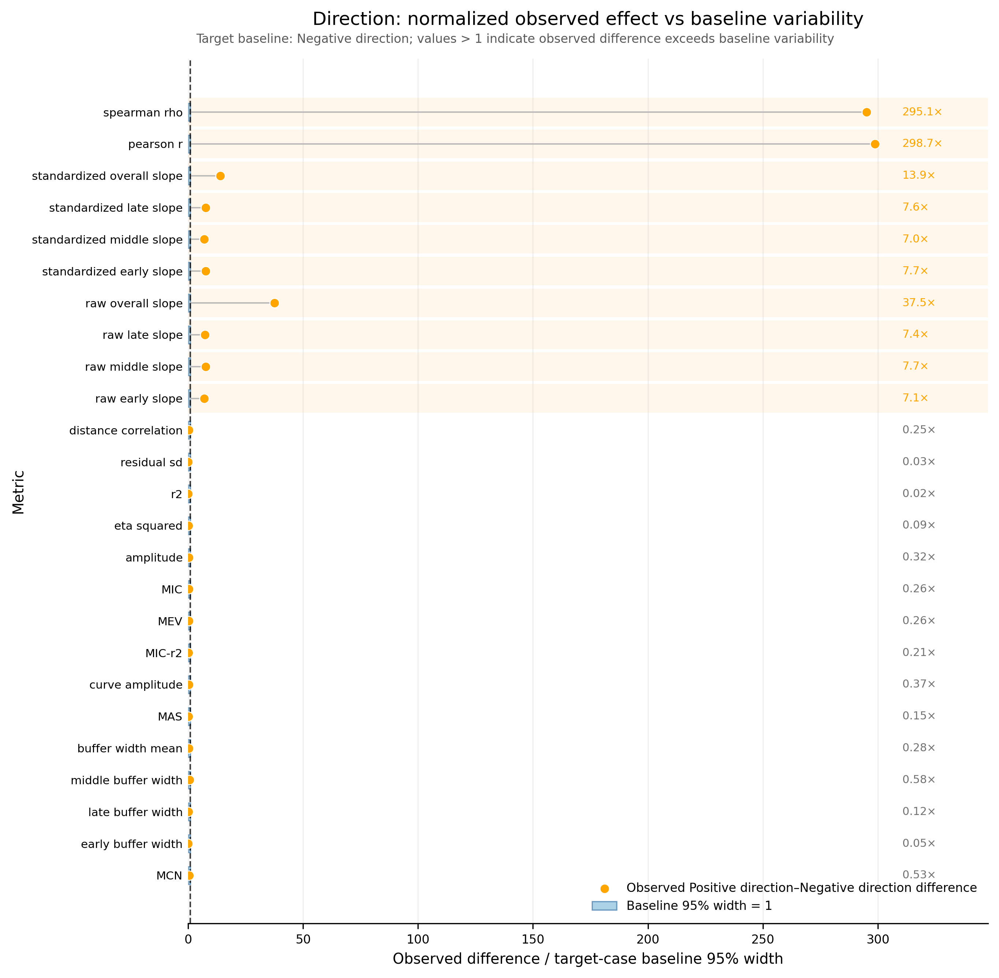

Plotting raw figure: Monotonicity


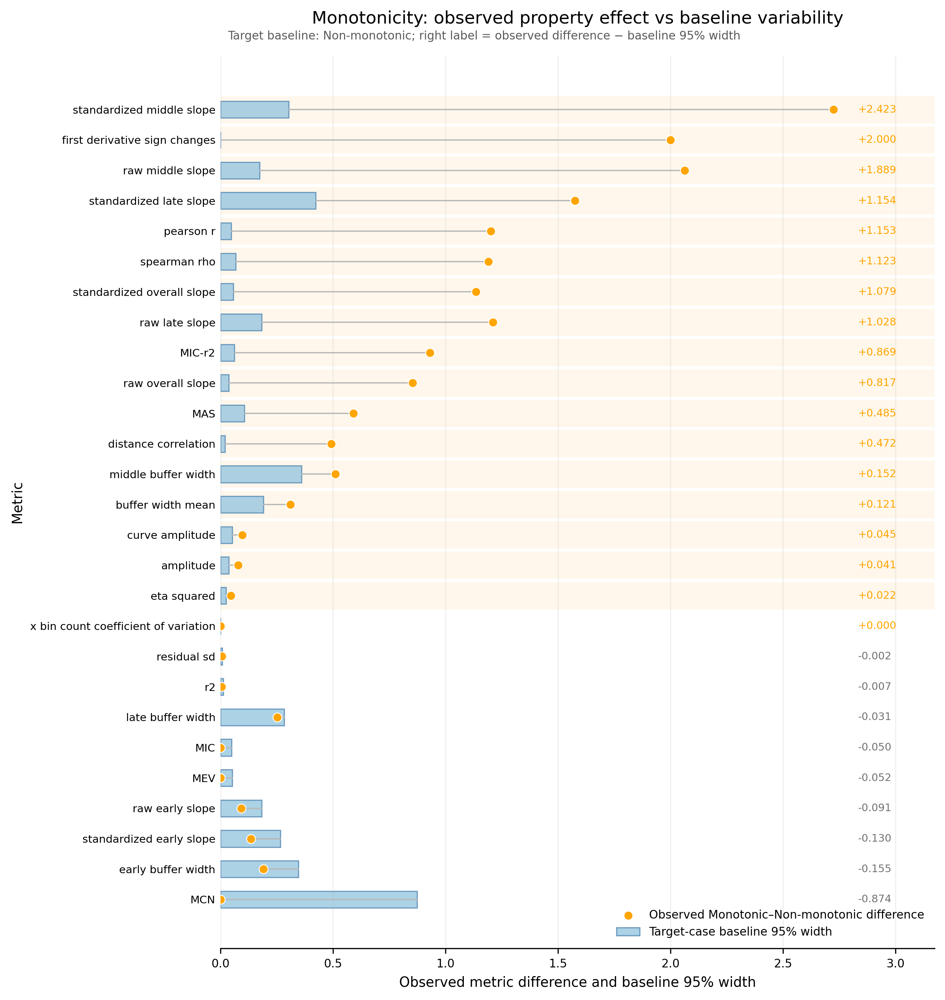

Plotting normalized figure: Monotonicity


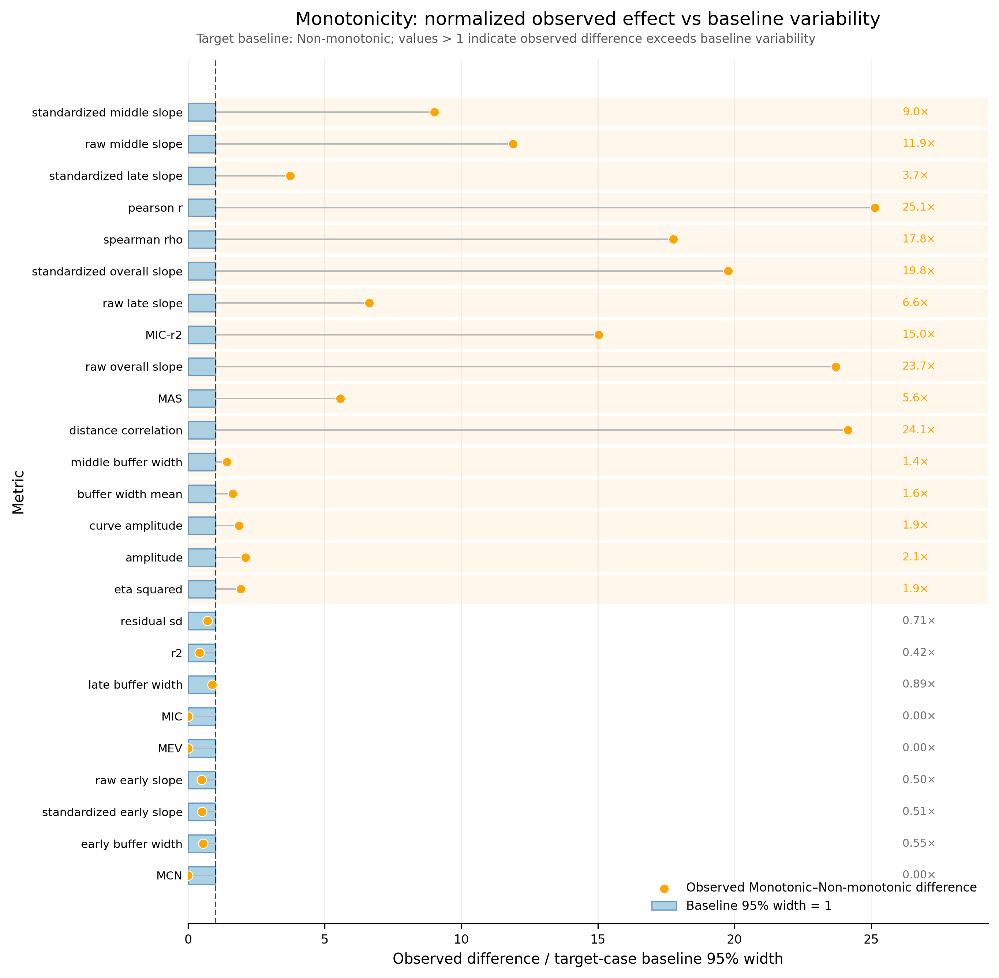

Plotting raw figure: Strength


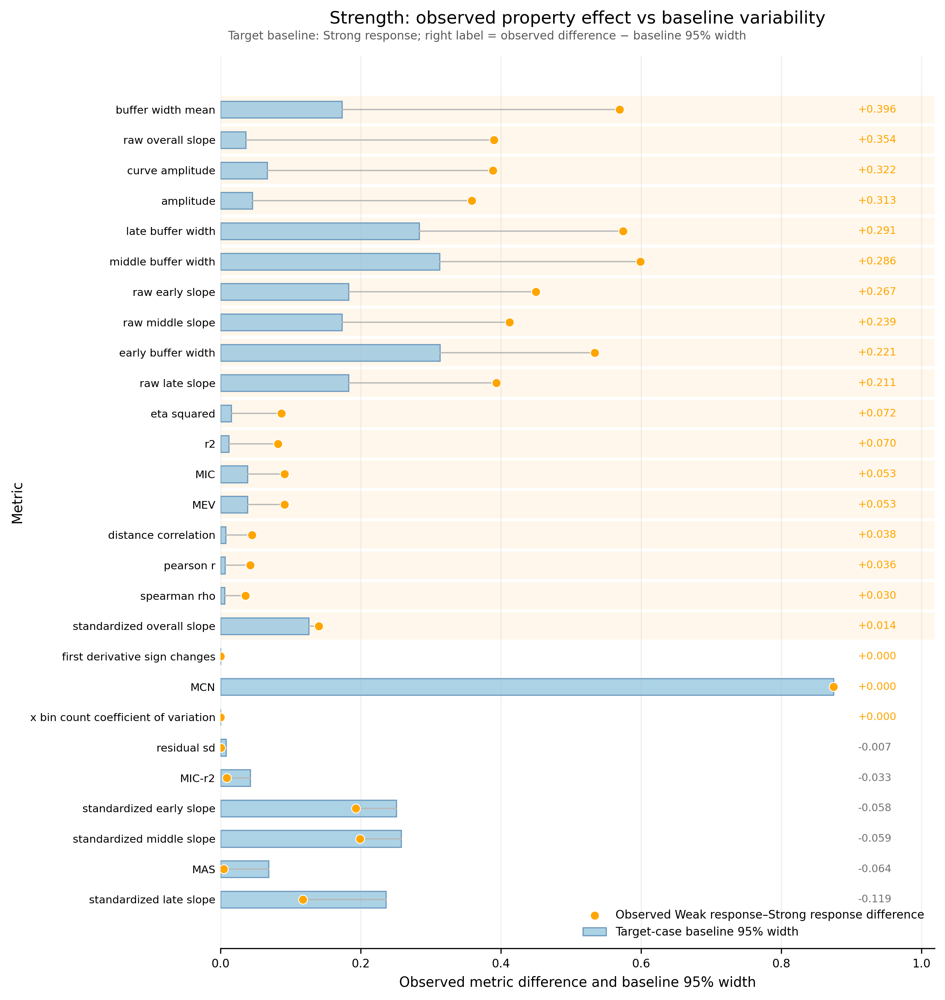

Plotting normalized figure: Strength


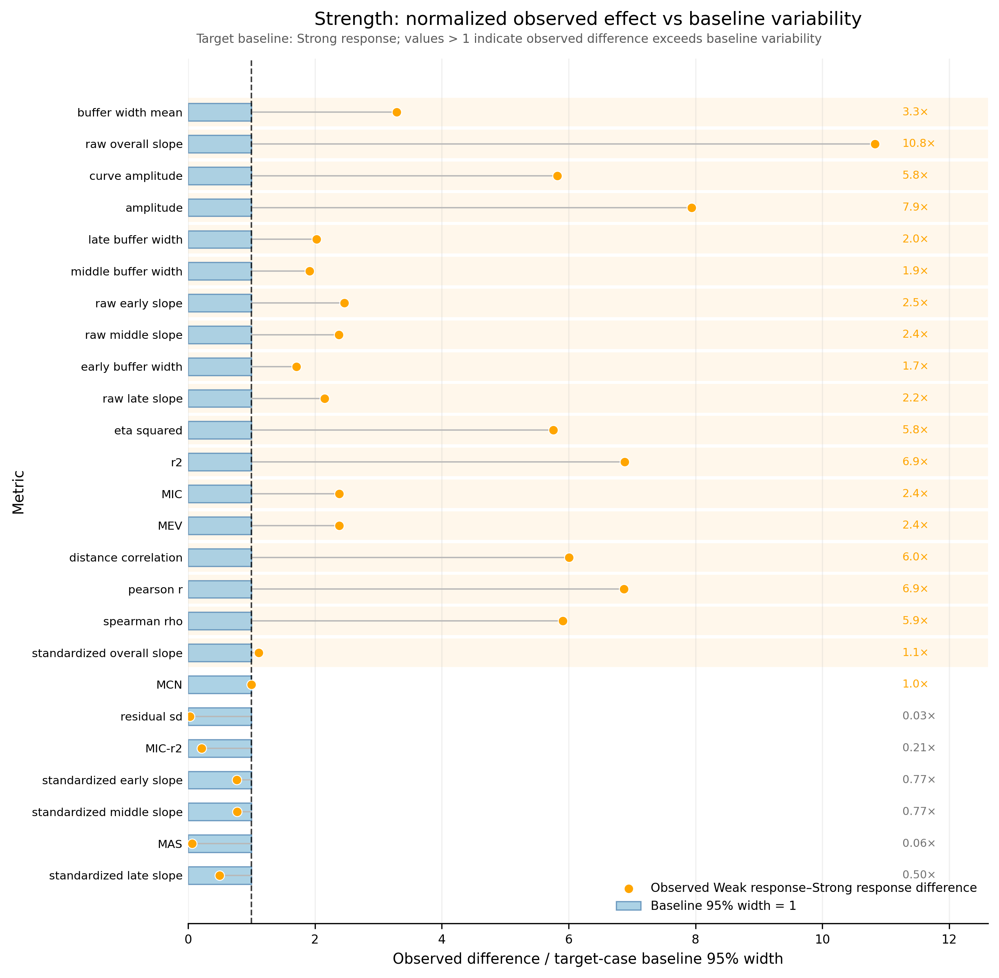

Plotting raw figure: Non-linearity


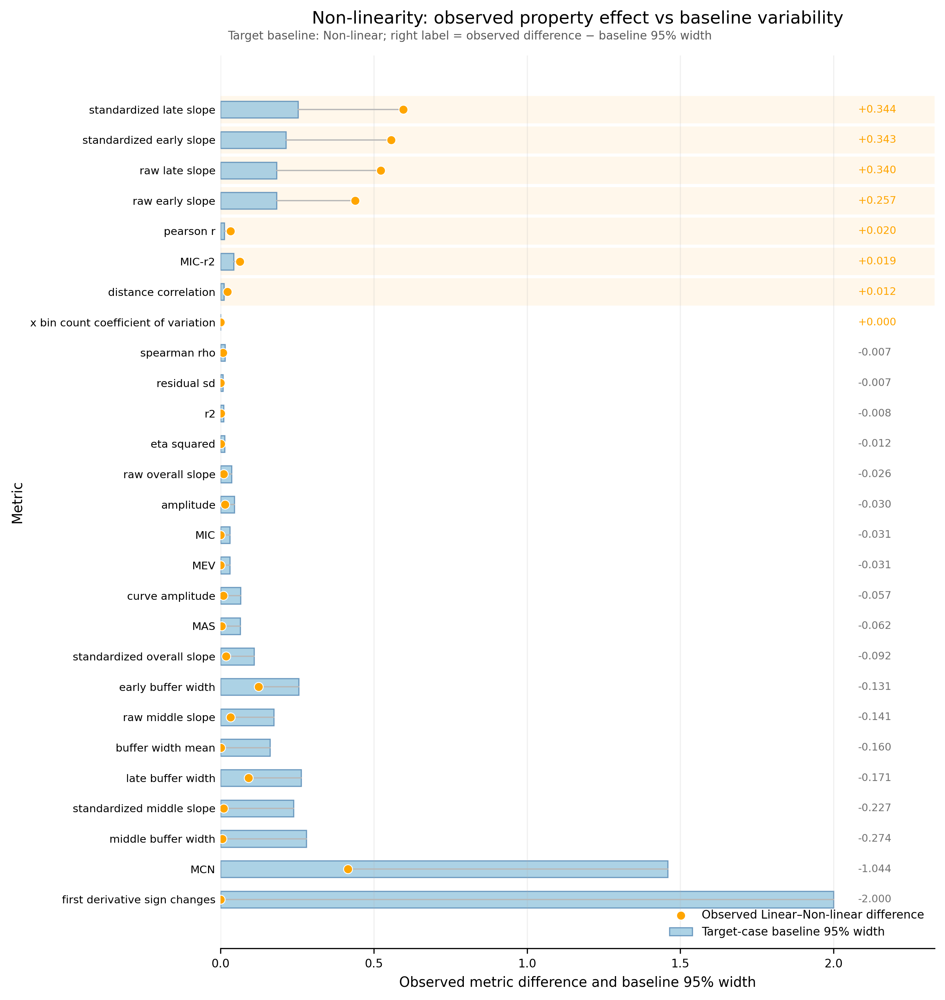

Plotting normalized figure: Non-linearity


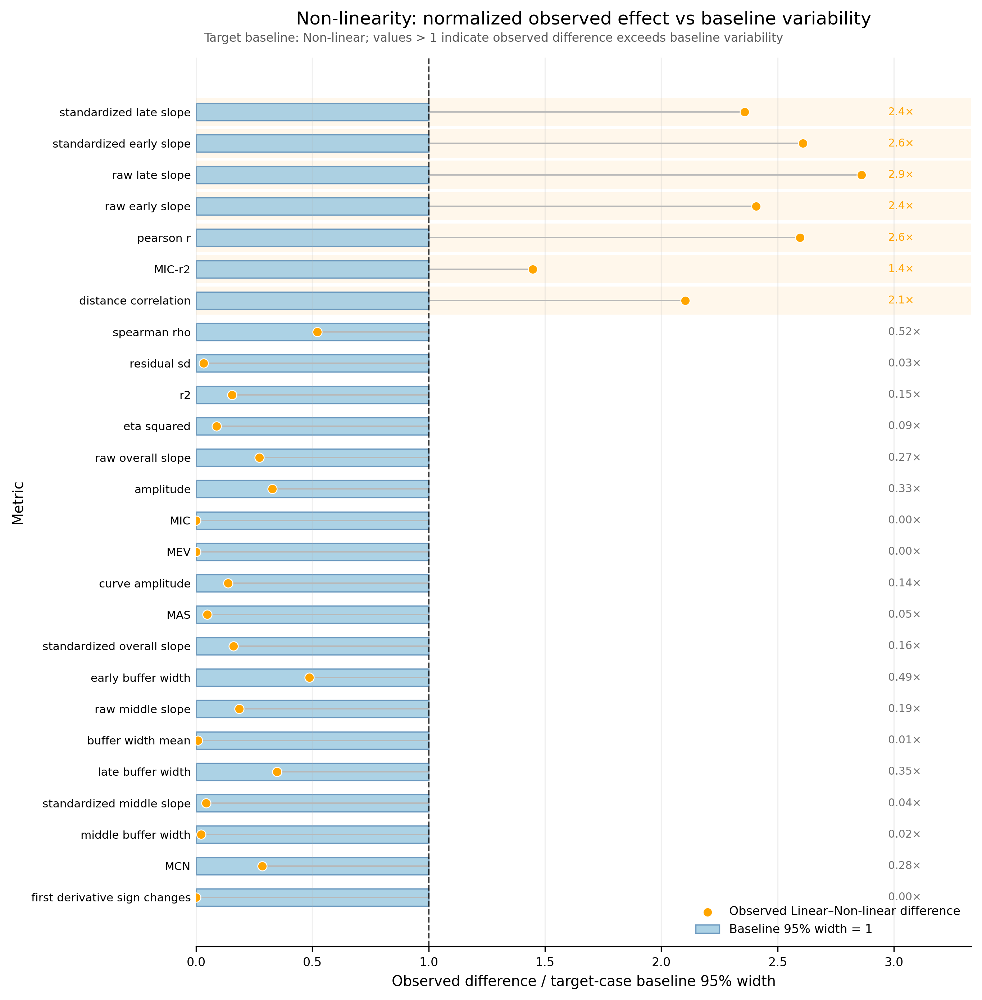

Plotting raw figure: Convexity / Concavity


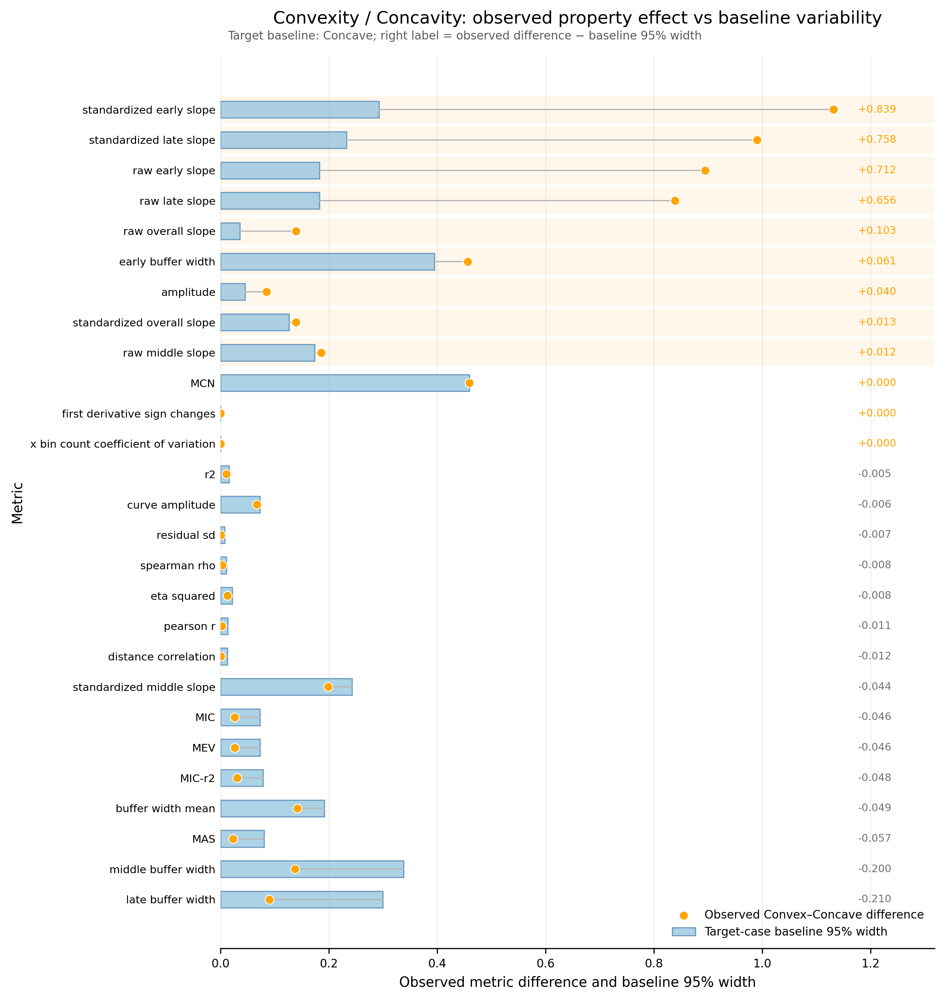

Plotting normalized figure: Convexity / Concavity


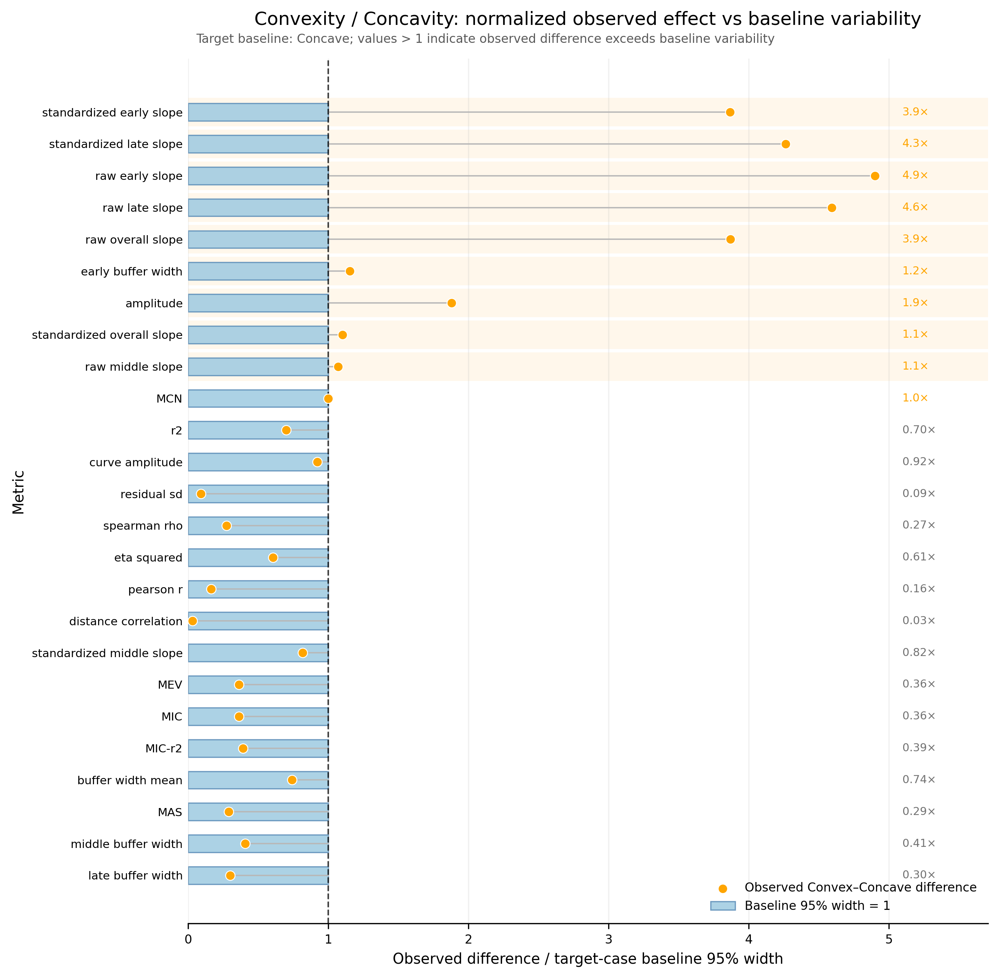

Plotting raw figure: Saturation


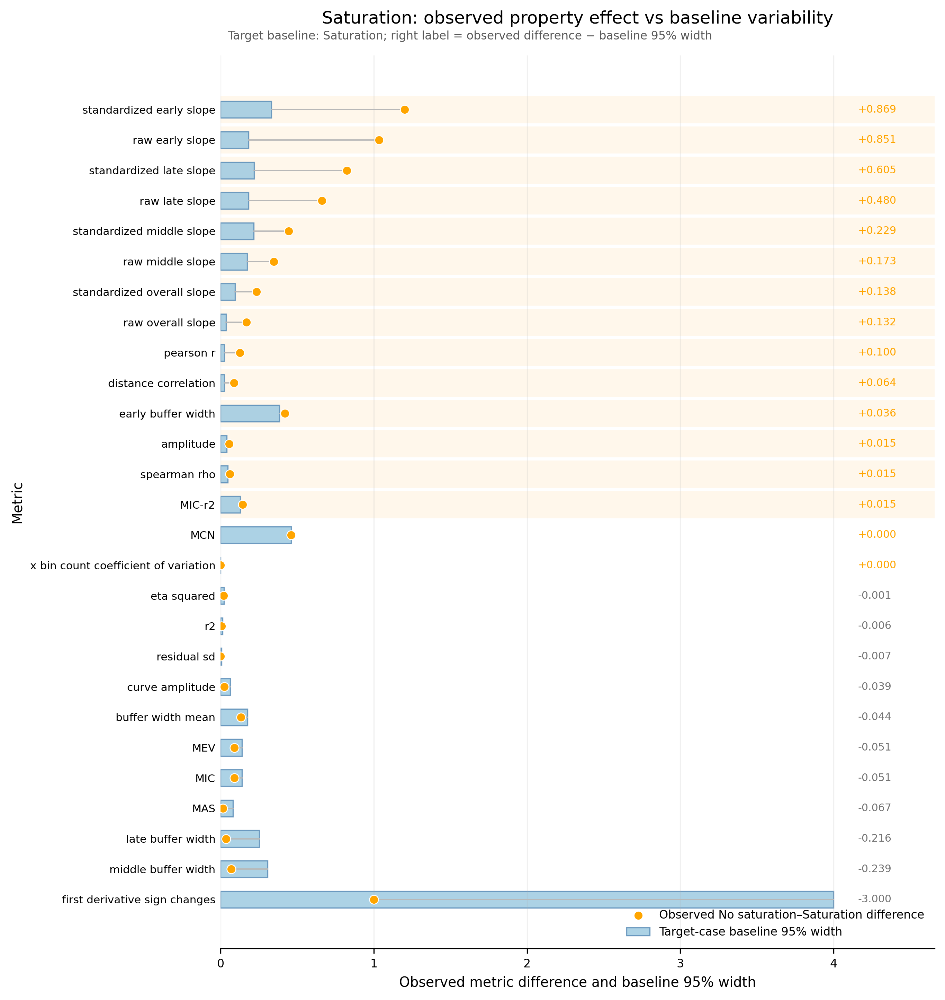

Plotting normalized figure: Saturation


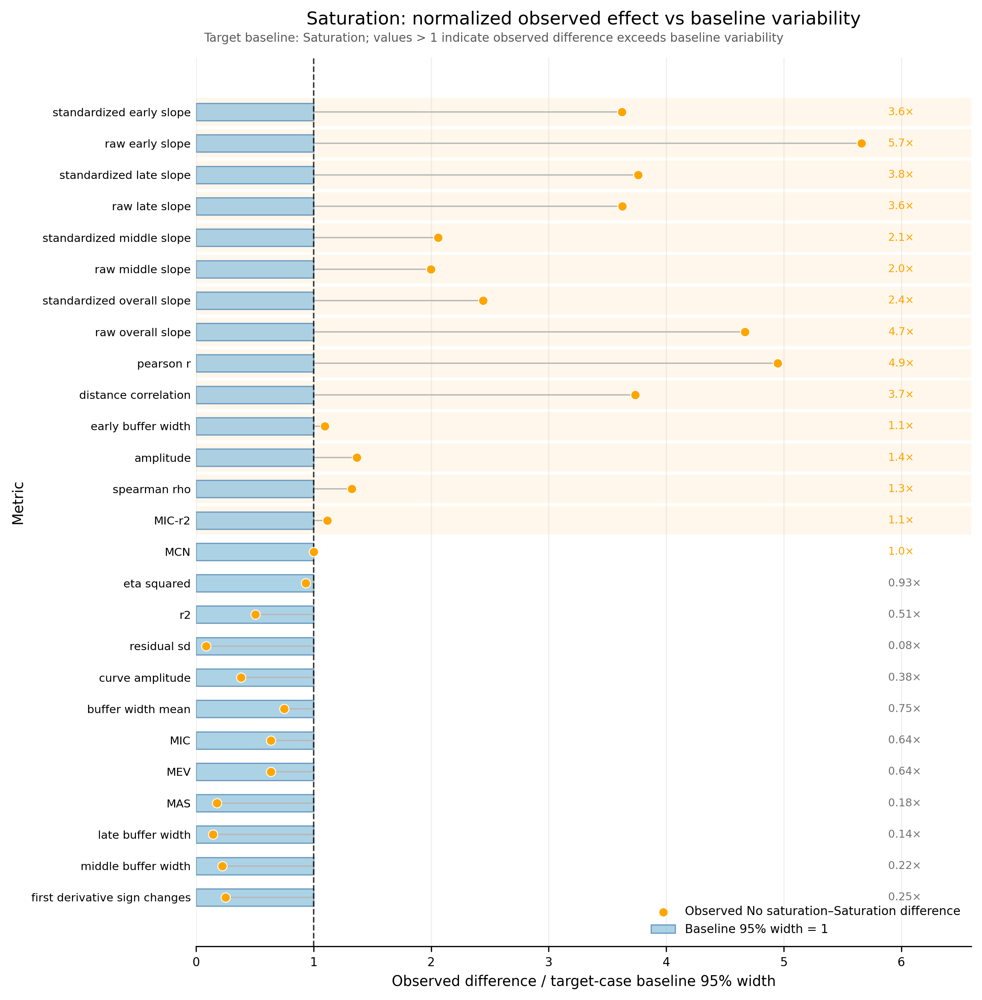

Plotting raw figure: Turning point


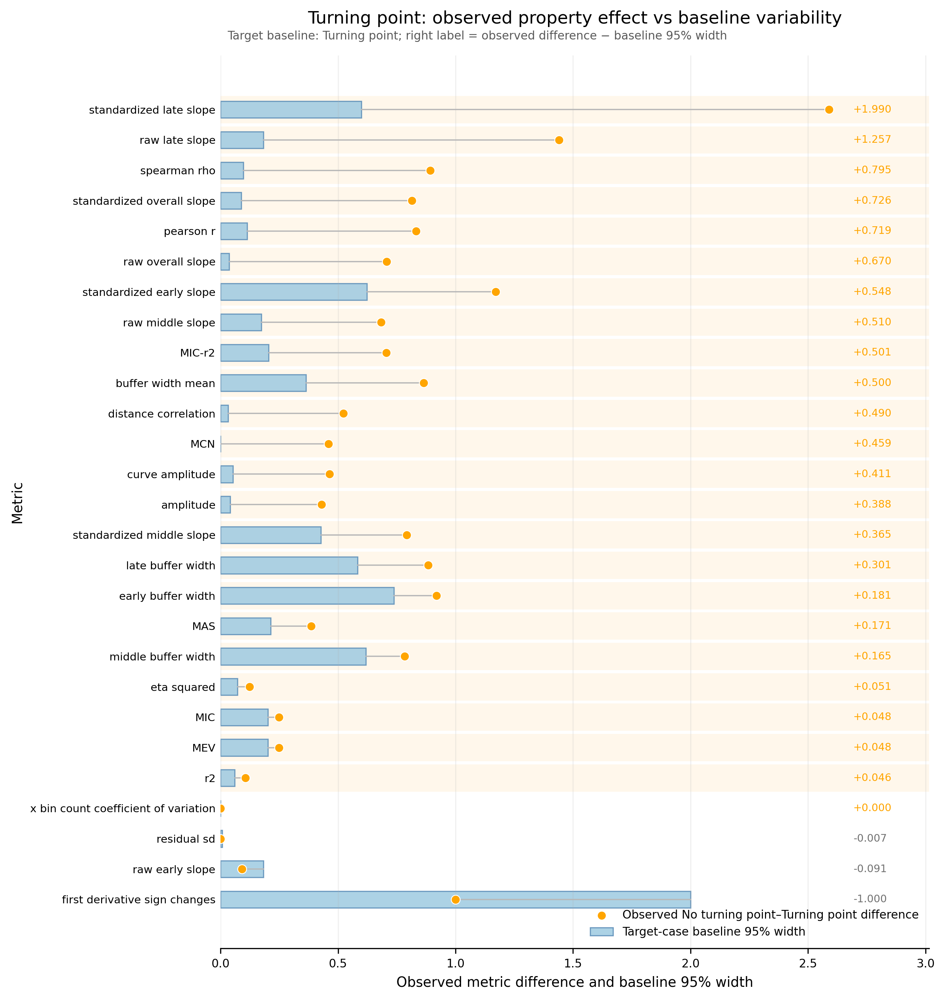

Plotting normalized figure: Turning point


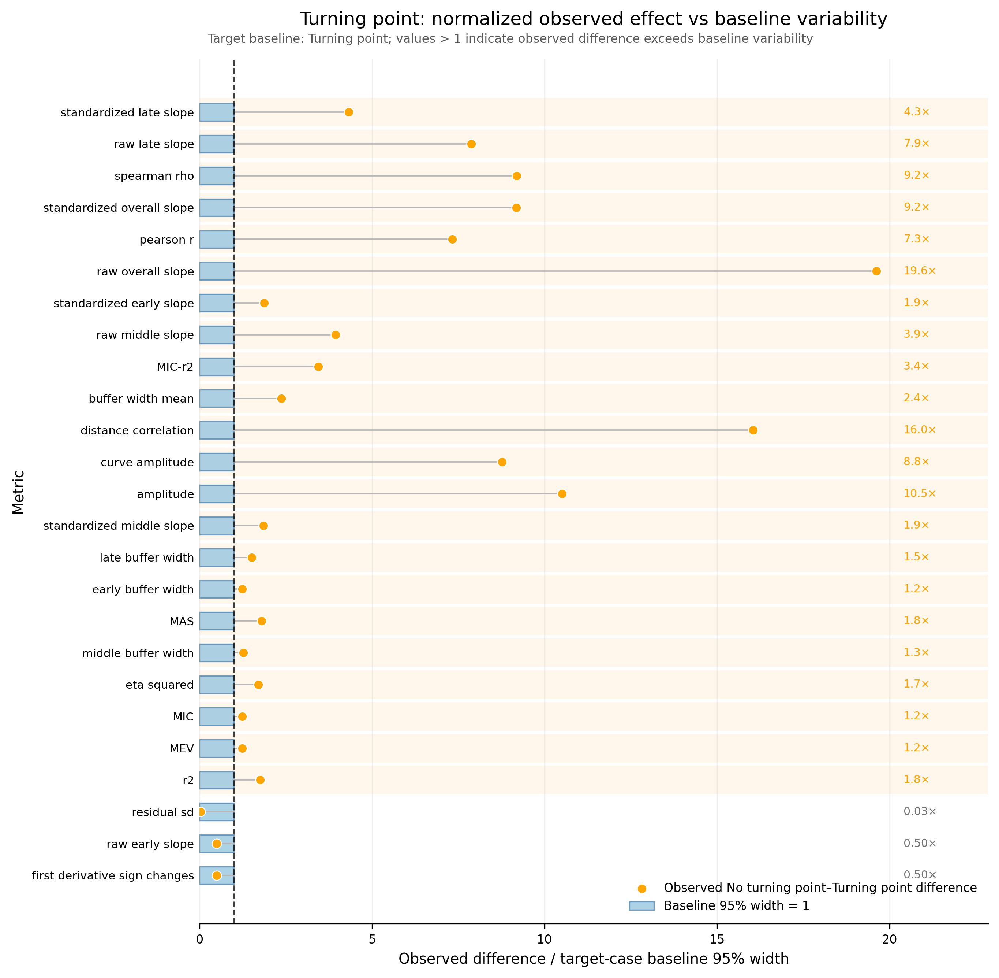

Plotting raw figure: Threshold


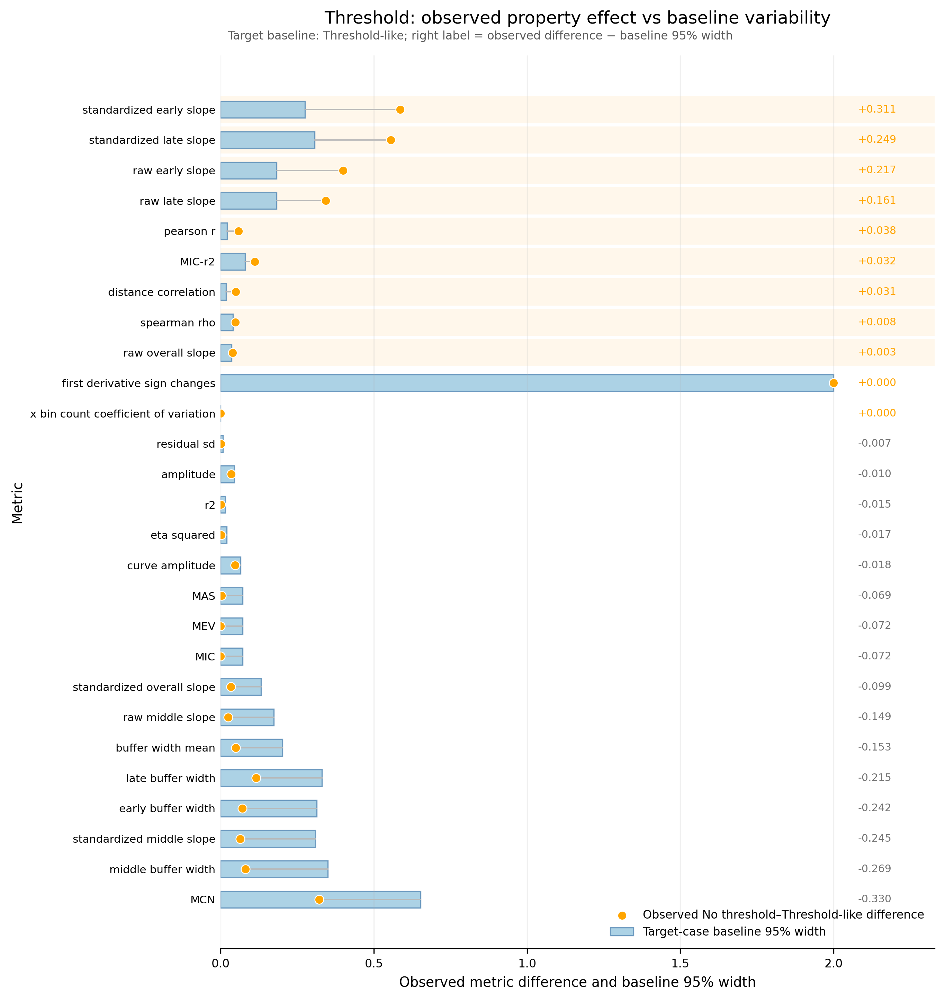

Plotting normalized figure: Threshold


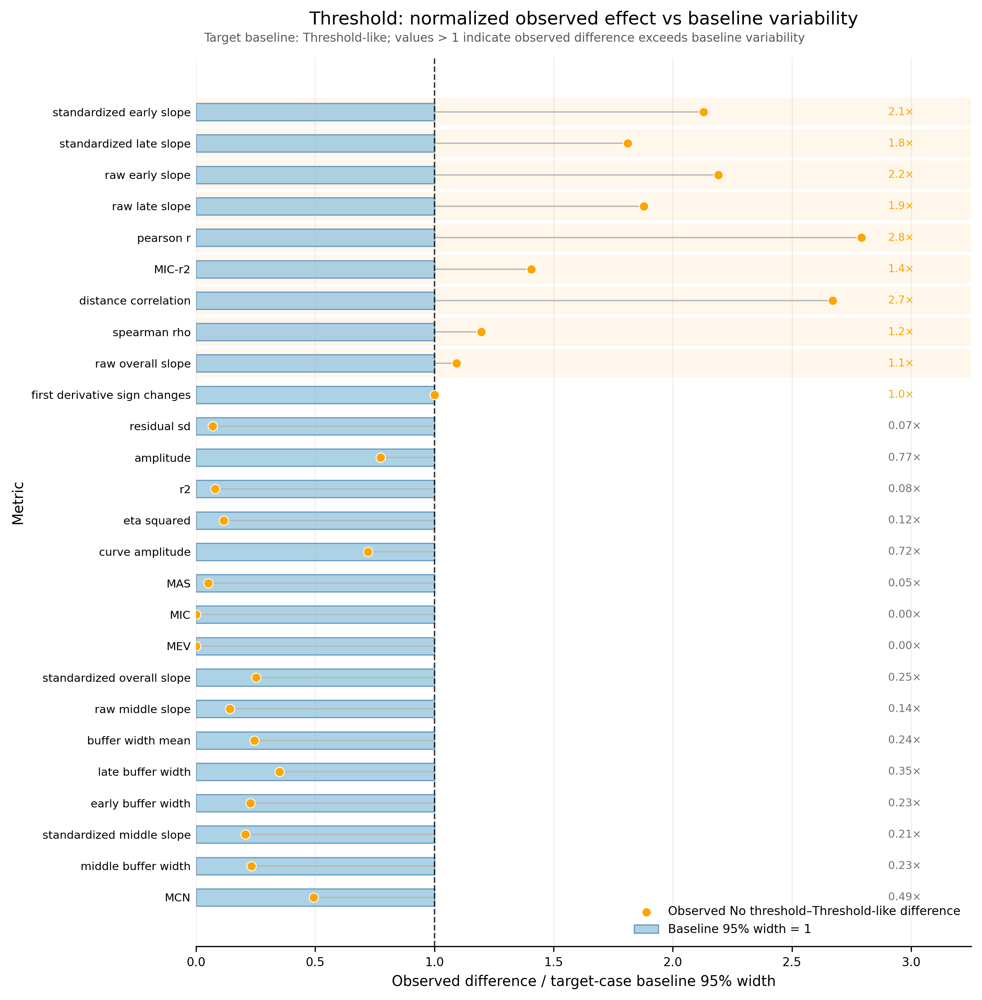

Plotting raw figure: Spread


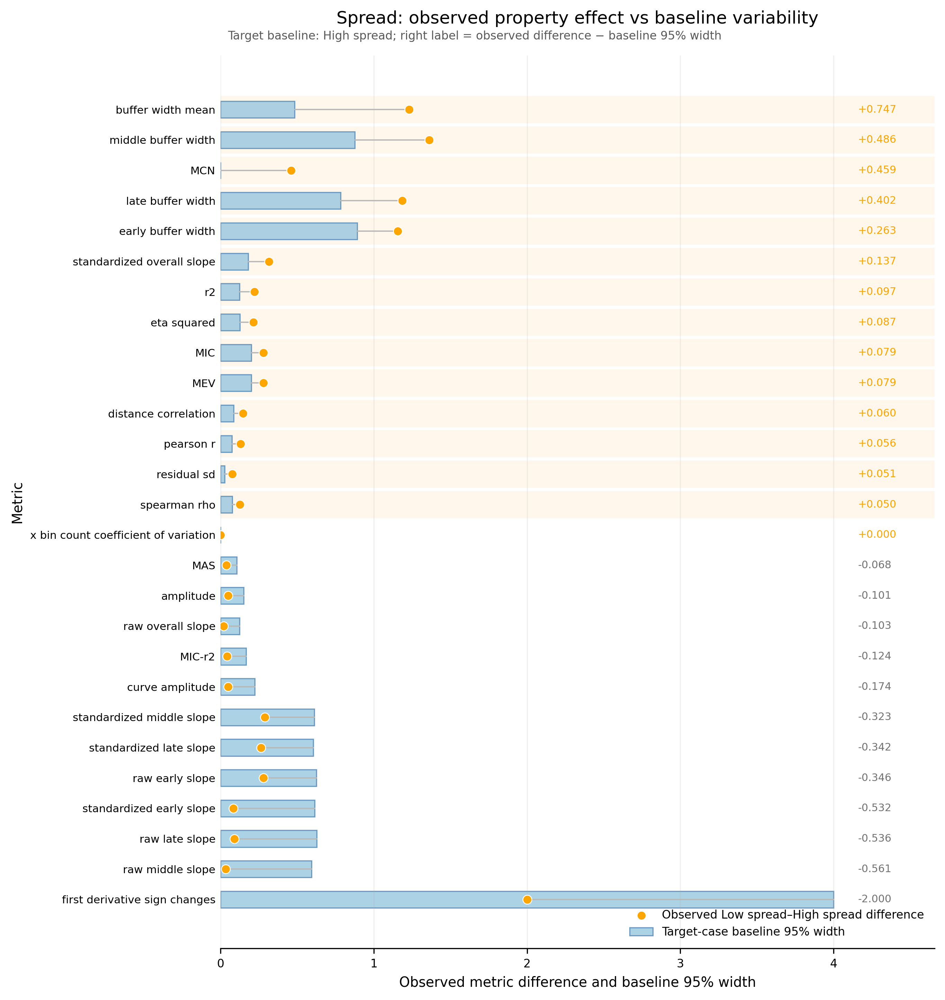

Plotting normalized figure: Spread


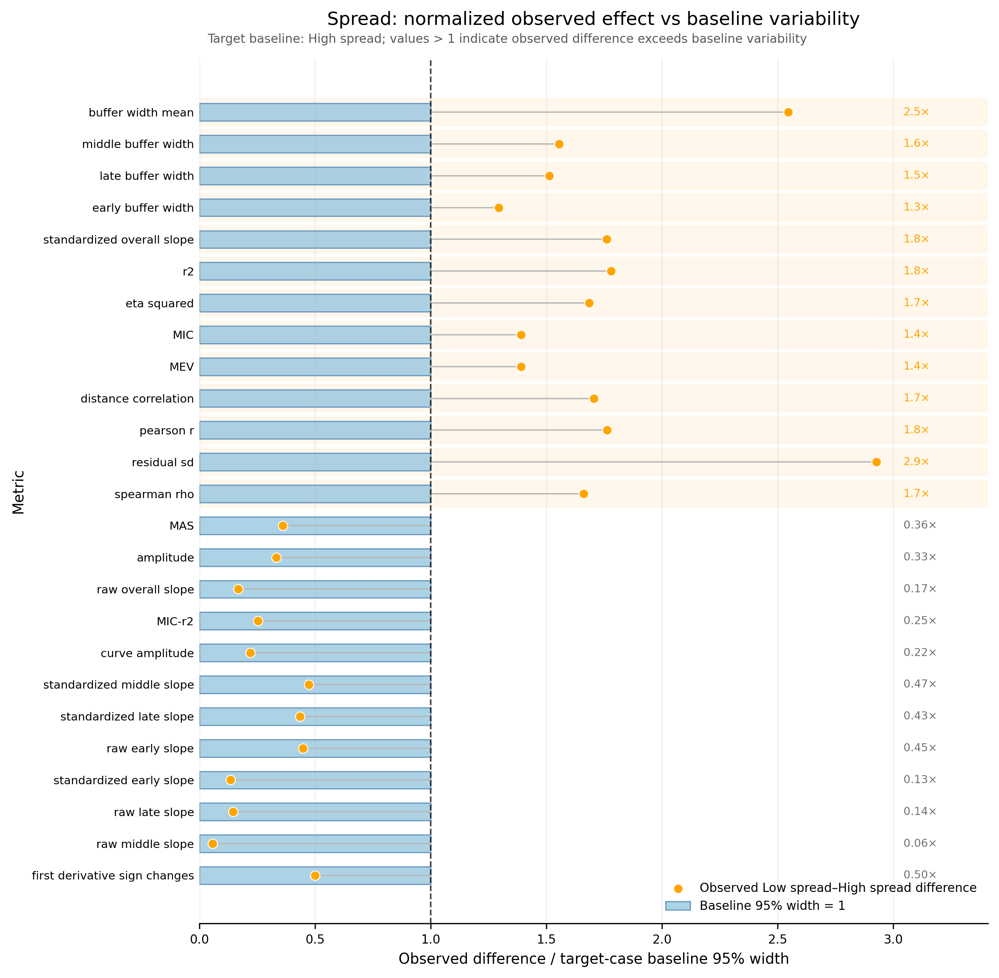

Plotting raw figure: Heteroscedasticity


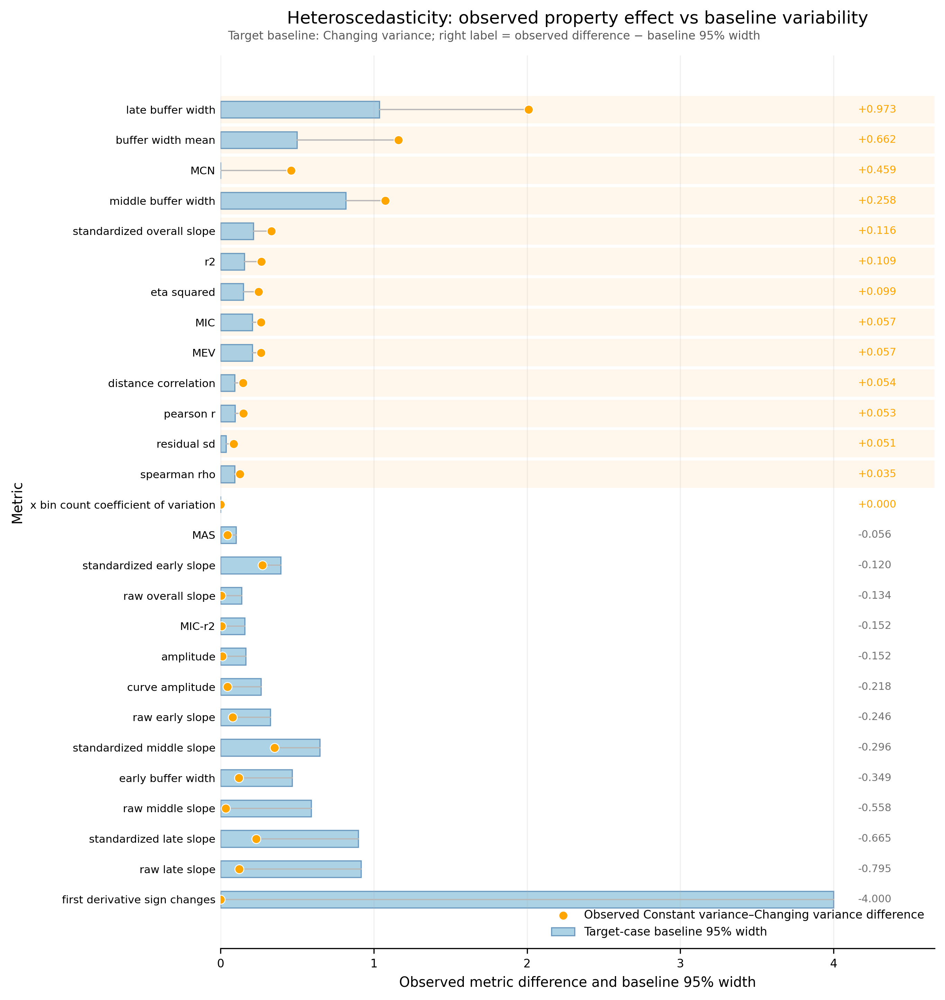

Plotting normalized figure: Heteroscedasticity


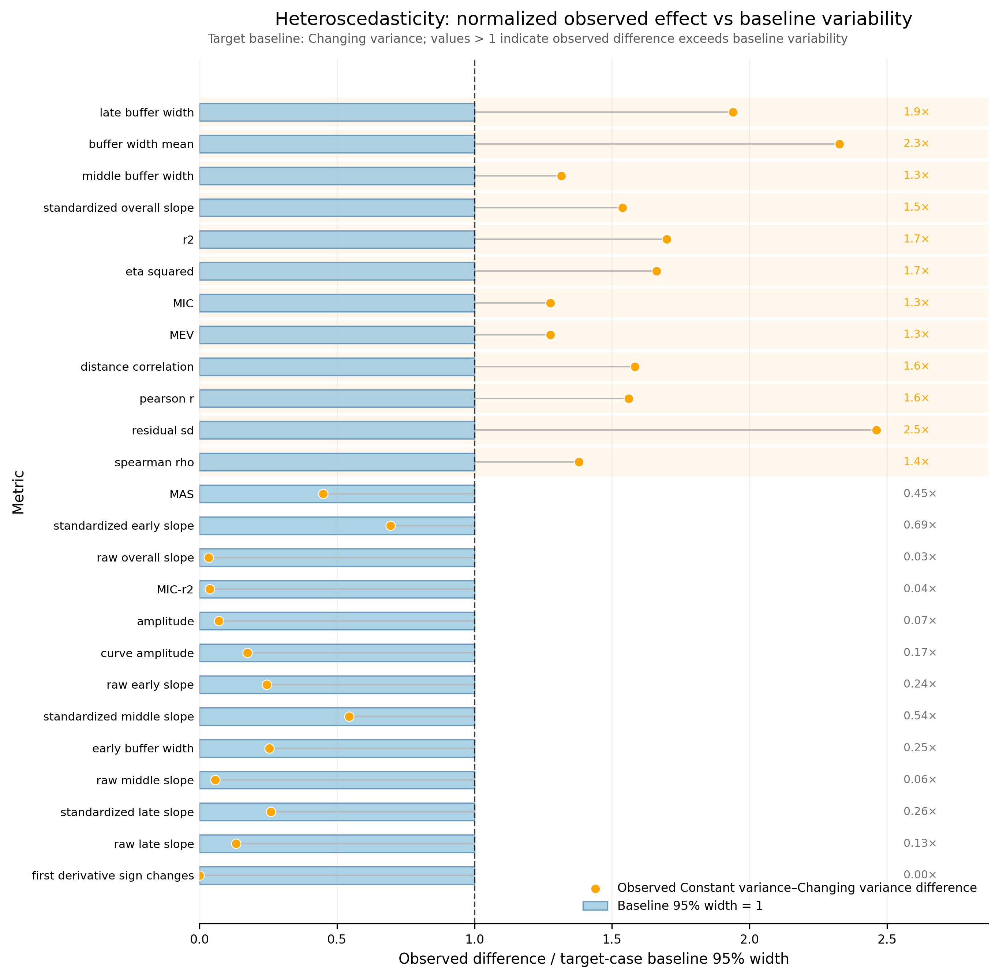

Plotting raw figure: Density


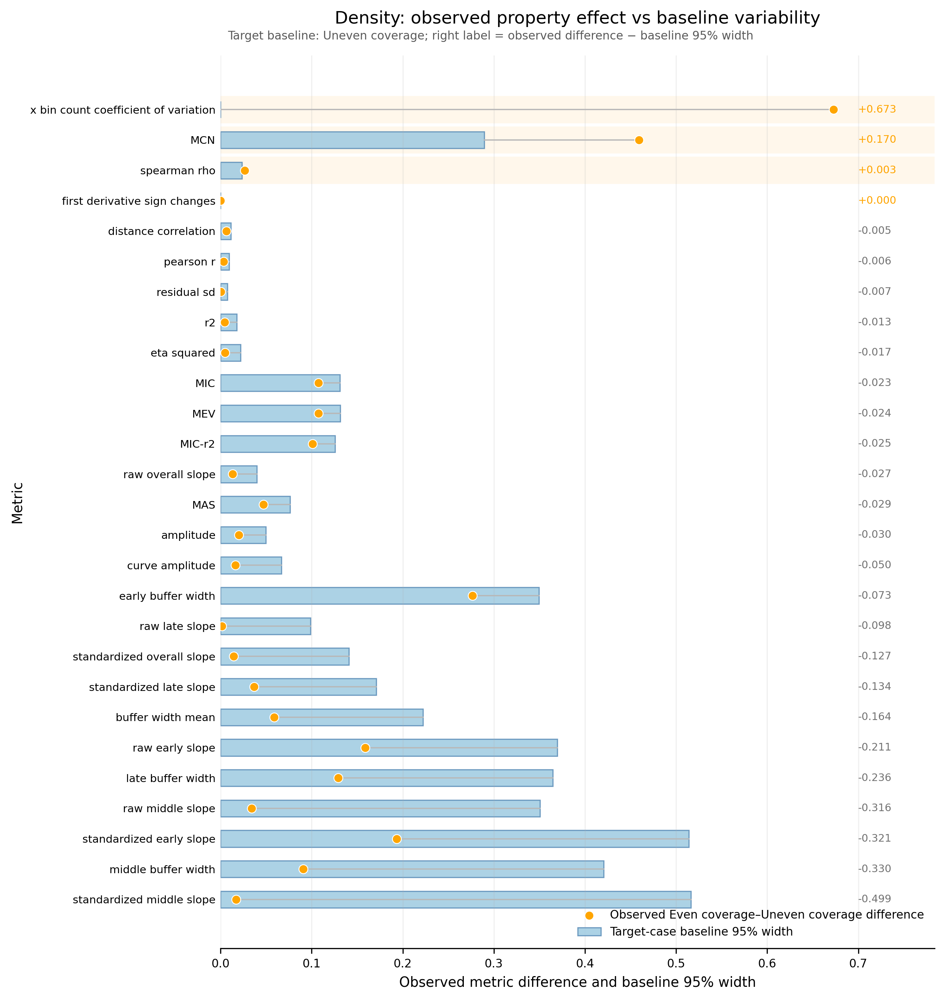

Plotting normalized figure: Density


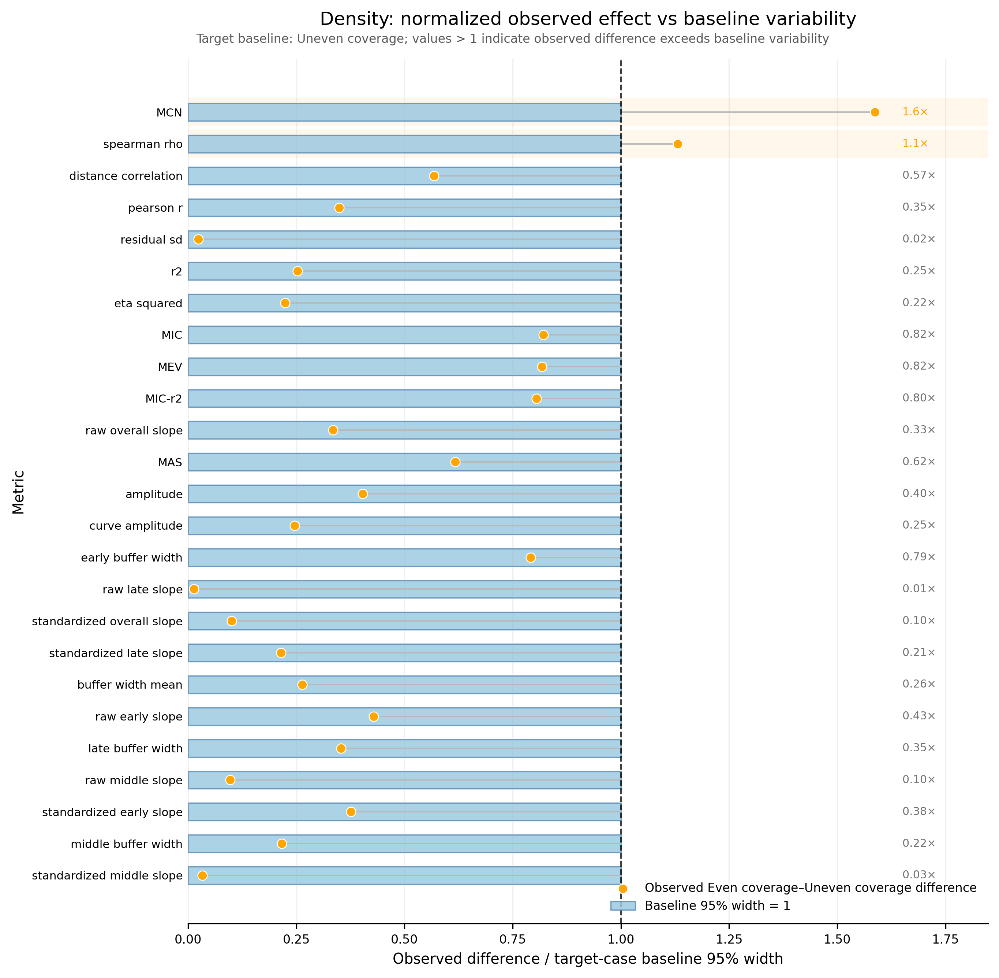

Plotting raw figure: Clustering


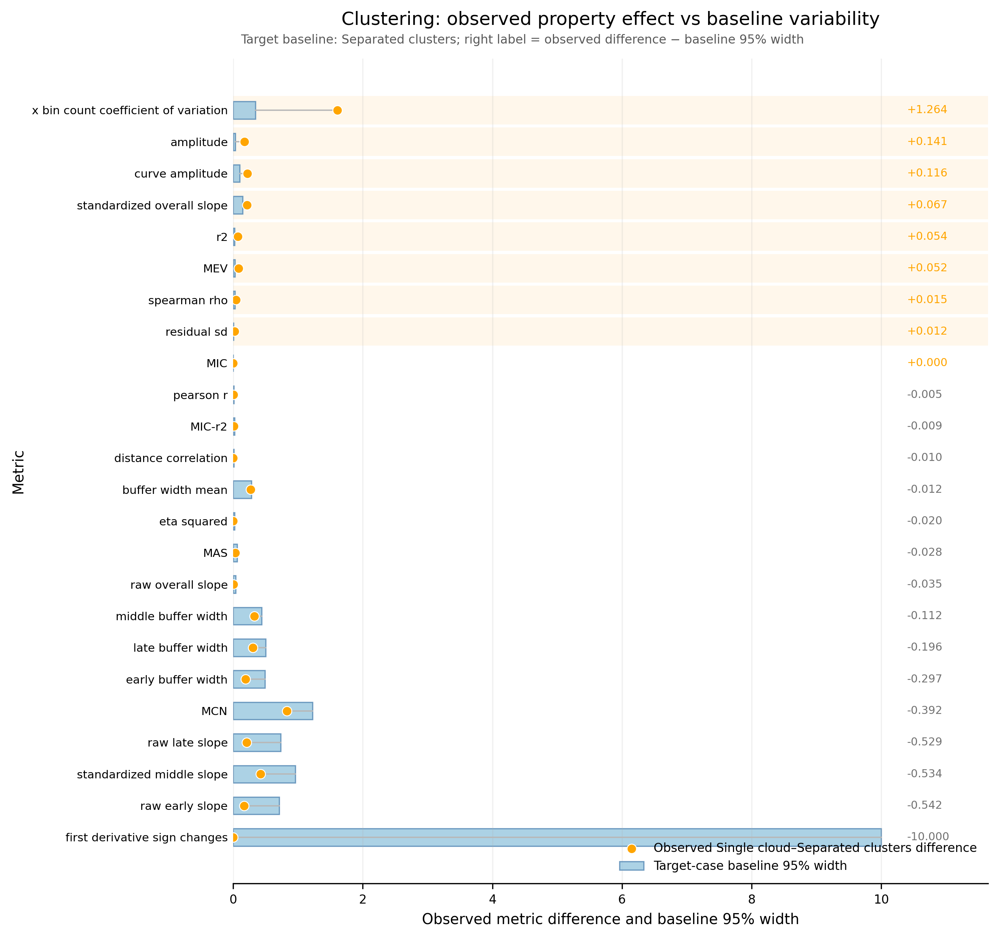

Plotting normalized figure: Clustering


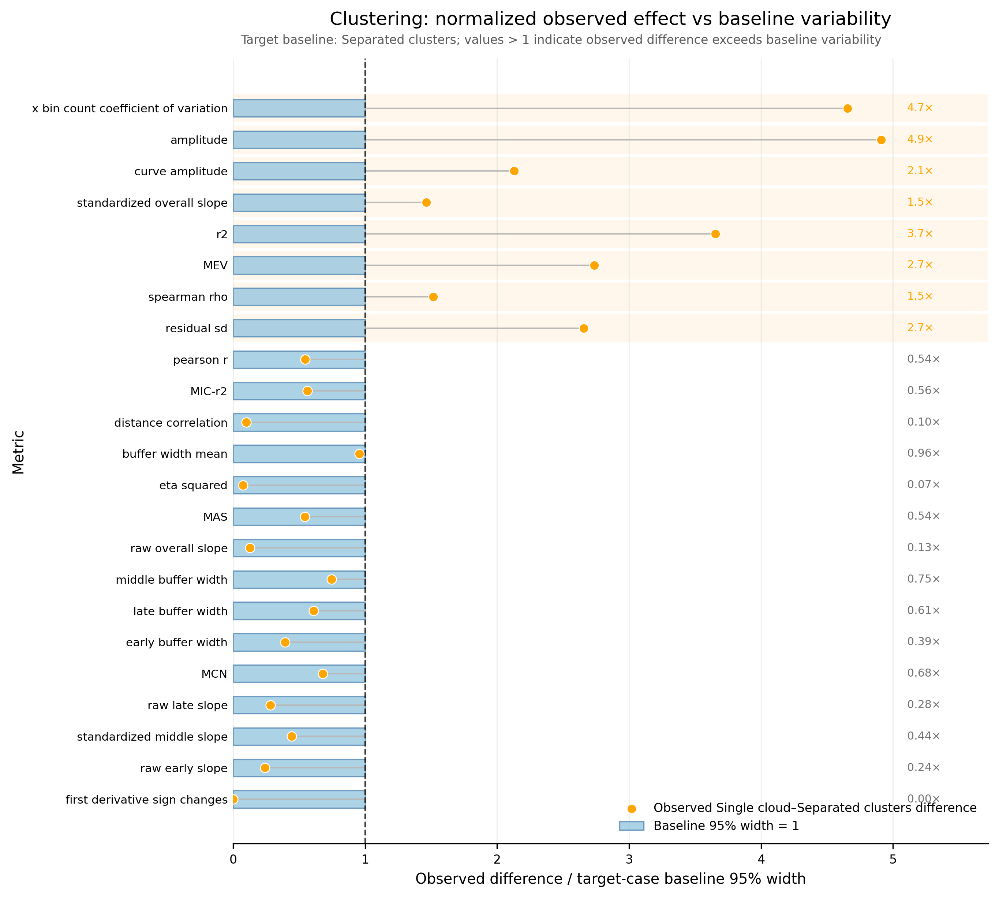

Plotting raw figure: Certainty


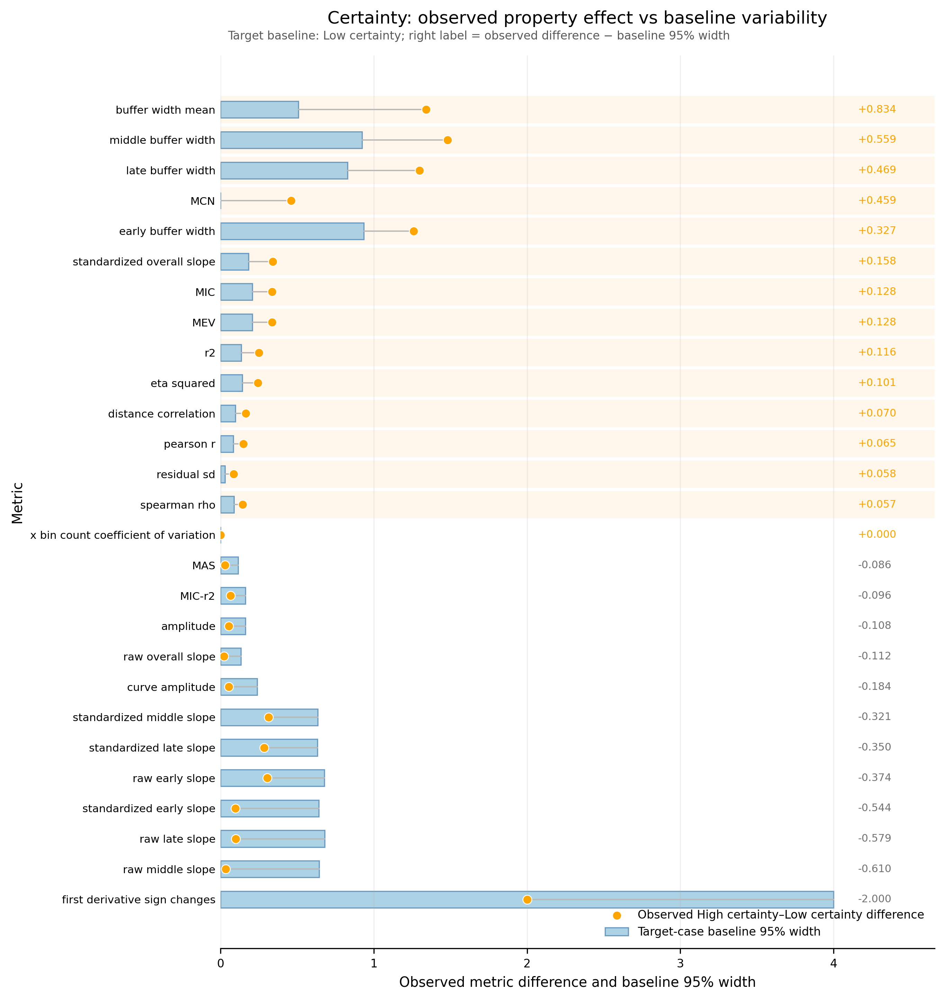

Plotting normalized figure: Certainty


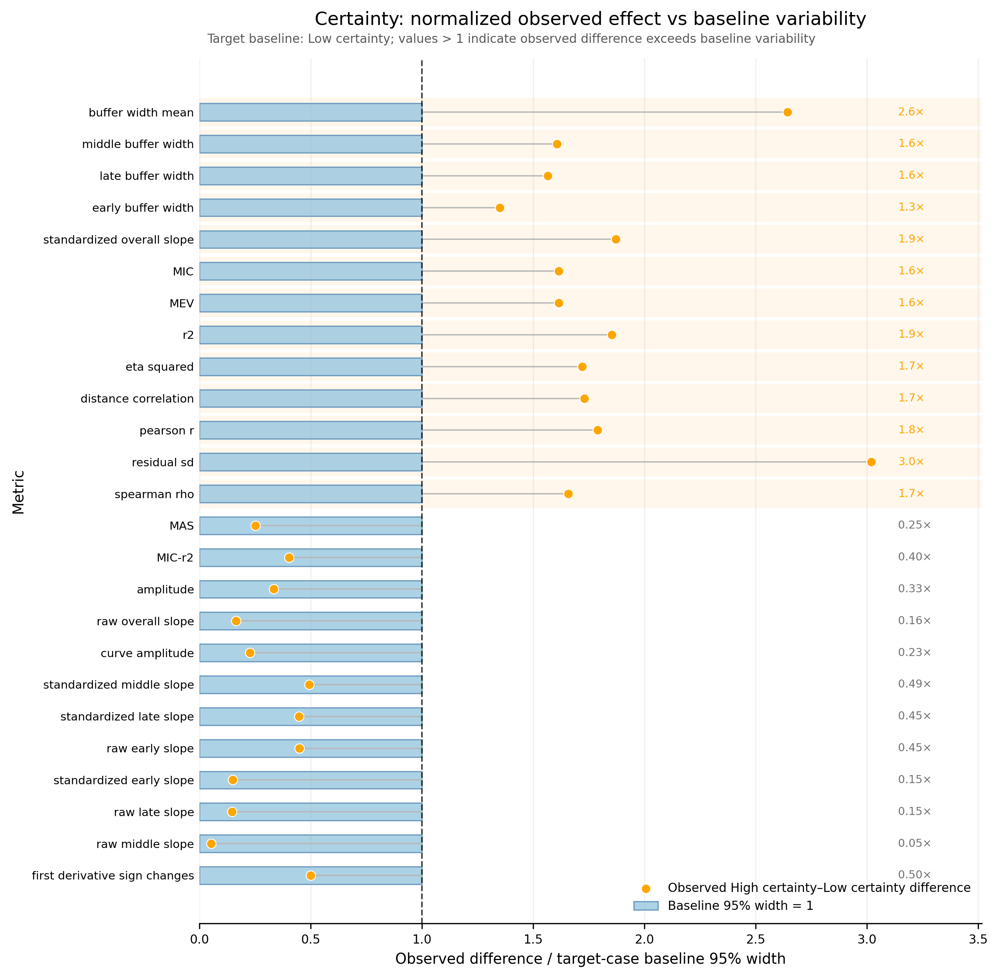

All figures saved to: ./property_baseline_outputs/figures


In [7]:
# ==========================================================
# Plot all properties:
# 1. Raw-scale figure for each property
# 2. Normalized figure for each property
# Figures are saved automatically
# ==========================================================

import os
import numpy as np
import matplotlib.pyplot as plt


# ----------------------------------------------------------
# Output directory
# ----------------------------------------------------------

figure_dir = "./property_baseline_outputs/figures"
os.makedirs(figure_dir, exist_ok=True)


def make_safe_filename(name):
    return (
        name
        .replace("/", "_")
        .replace("\\", "_")
        .replace(" ", "_")
        .replace("-", "_")
        .replace(":", "_")
    )


# ==========================================================
# Raw-scale plot for one property
# ==========================================================
def plot_property_baseline_raw_save(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
    save_dir=None,
    show=True,
):
    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a = result["case_a_name"]
    case_b = result["case_b_name"]

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
        ]
    )

    # observed - 1000-run baseline width, no extra absolute value
    plot_df["observed_minus_baseline95"] = (
        plot_df["observed_difference"] - plot_df["baseline_95_width"]
    )

    # Sort by observed - baseline 95% width from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_minus_baseline95"] > 0
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Highlight rows where observed difference > baseline 95% width
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Baseline 95% width
    ax.barh(
        y_pos,
        plot_df["baseline_95_width"],
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="Target-case baseline 95% width",
    )

    # Connector between baseline width and observed difference
    for i, row in plot_df.iterrows():
        ax.plot(
            [row["baseline_95_width"], row["observed_difference"]],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Observed difference point
    ax.scatter(
        plot_df["observed_difference"],
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label=f"Observed {case_a}–{case_b} difference",
    )

    # ------------------------------------------------------
    # Right-side label:
    # observed difference - baseline 95% width
    # ------------------------------------------------------
    x_max = np.nanmax([
        plot_df["baseline_95_width"].max(),
        plot_df["observed_difference"].max(),
    ])

    x_text = x_max * 1.04 if x_max > 0 else 1

    for i, row in plot_df.iterrows():

        gap = row["observed_minus_baseline95"]

        if gap >= 0:
            label = f"+{gap:.3f}"
            color = "orange"
        else:
            label = f"{gap:.3f}"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed metric difference and baseline 95% width",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: observed property effect vs baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target baseline: {case_b}; right label = observed difference − baseline 95% width",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()

    if save_dir is not None:
        safe_name = make_safe_filename(property_name)
        save_path = os.path.join(
            save_dir,
            f"{safe_name}_raw_observed_vs_baseline95.png"
        )
        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight",
        )

    if show:
        plt.show()
    else:
        plt.close(fig)

# ==========================================================
# Normalized plot for one property
# ==========================================================

def plot_property_baseline_normalized_save(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
    save_dir=None,
    show=True,
):
    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a = result["case_a_name"]
    case_b = result["case_b_name"]

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
        ]
    )

    plot_df = plot_df[plot_df["baseline_95_width"] > 0].copy()

    plot_df["observed_minus_baseline95"] = (
        plot_df["observed_difference"] - plot_df["baseline_95_width"]
    )

    plot_df["observed_ratio"] = (
        plot_df["observed_difference"] / plot_df["baseline_95_width"]
    )

    # Sort by observed - baseline95 from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_minus_baseline95"] > 0
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Highlight rows where observed difference > baseline 95% width
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Normalized baseline width = 1
    ax.barh(
        y_pos,
        np.ones(n_metrics),
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="Baseline 95% width = 1",
    )

    observed_ratio = plot_df["observed_ratio"].values

    # Connector from baseline = 1 to observed ratio
    for i, ratio in enumerate(observed_ratio):
        ax.plot(
            [1, ratio],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Observed ratio point
    ax.scatter(
        observed_ratio,
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label=f"Observed {case_a}–{case_b} difference",
    )

    # Threshold line
    ax.axvline(
        1,
        color="black",
        linestyle="--",
        linewidth=1.0,
        alpha=0.75,
    )

    # Right-side label: ratio
    x_max = max(np.nanmax(observed_ratio), 1)
    x_text = x_max * 1.04 if x_max > 0 else 1

    for i, row in plot_df.iterrows():

        ratio = row["observed_ratio"]

        if ratio >= 1:
            label = f"{ratio:.1f}×"
            color = "orange"
        else:
            label = f"{ratio:.2f}×"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed difference / target-case baseline 95% width",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: normalized observed effect vs baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target baseline: {case_b}; values > 1 indicate observed difference exceeds baseline variability",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()

    if save_dir is not None:
        safe_name = make_safe_filename(property_name)
        save_path = os.path.join(
            save_dir,
            f"{safe_name}_normalized_observed_vs_baseline95.png"
        )
        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight",
        )

    if show:
        plt.show()
    else:
        plt.close(fig)


# ==========================================================
# Run plots for all properties
# ==========================================================

for property_name in properties_to_run:

    print(f"Plotting raw figure: {property_name}")

    plot_property_baseline_raw_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=True,      # set False if you only want to save
    )

    print(f"Plotting normalized figure: {property_name}")

    plot_property_baseline_normalized_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=True,      # set False if you only want to save
    )

print(f"All figures saved to: {figure_dir}")

In [8]:
for property_name in properties_to_run:

    plot_property_baseline_raw_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=False,
    )

    plot_property_baseline_normalized_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=False,
    )

print(f"All figures saved to: {figure_dir}")

All figures saved to: ./property_baseline_outputs/figures


In [9]:
# ==========================================================
# Save all ratio > 1 results into one CSV
# ==========================================================

import os
import numpy as np
import pandas as pd

output_dir = "./property_baseline_outputs"
os.makedirs(output_dir, exist_ok=True)

# ----------------------------------------------------------
# If all_comparison_df already exists, use it directly.
# Otherwise, rebuild it from all_property_results.
# ----------------------------------------------------------

all_comparison_records = []

for property_name, result in all_property_results.items():

    df = result["comparison_df"].copy()

    df["property"] = property_name
    df["case_a"] = result["case_a_name"]
    df["case_b"] = result["case_b_name"]

    df["observed_minus_baseline95"] = (
        df["observed_difference"] - df["baseline_95_width"]
    )

    all_comparison_records.append(df)

all_comparison_df = pd.concat(
    all_comparison_records,
    ignore_index=True
)

all_comparison_df = all_comparison_df.replace([np.inf, -np.inf], np.nan)

# ----------------------------------------------------------
# Filter ratio > 1
# ----------------------------------------------------------

ratio_gt1_df = all_comparison_df[
    all_comparison_df["ratio_to_baseline_95_width"] > 1
].copy()

# Sort by property first, then by ratio from large to small
ratio_gt1_df = ratio_gt1_df.sort_values(
    ["property", "ratio_to_baseline_95_width"],
    ascending=[True, False]
).reset_index(drop=True)

# ----------------------------------------------------------
# Save to CSV
# ----------------------------------------------------------

ratio_gt1_path = os.path.join(
    output_dir,
    "all_properties_ratio_gt1_results.csv"
)

ratio_gt1_df.to_csv(
    ratio_gt1_path,
    index=False,
    encoding="utf-8-sig"
)

print(f"Saved ratio > 1 results to: {ratio_gt1_path}")

display(ratio_gt1_df)

Saved ratio > 1 results to: ./property_baseline_outputs/all_properties_ratio_gt1_results.csv


,property,case_a,case_b,metric,case_a_value,case_b_value,observed_difference,baseline_mean,baseline_sd,baseline_min,baseline_max,baseline_q025,baseline_q975,baseline_95_width,baseline_range,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range,observed_minus_baseline95
0,Certainty,High certainty,Low certainty,residual sd,0.031425,0.117536,0.086111,0.126773,0.007137,0.107049,0.149564,0.112360,0.140885,0.028525,0.042515,3.018826,12.065928,True,True,0.057586
1,Certainty,High certainty,Low certainty,buffer width mean,0.725971,2.067561,1.341589,2.152650,0.134362,1.785109,2.529935,1.892108,2.399649,0.507541,0.744826,2.643310,9.984859,True,True,0.834048
2,Certainty,High certainty,Low certainty,standardized overall slope,0.917234,0.577443,0.339792,0.576800,0.046731,0.414494,0.716124,0.483643,0.665209,0.181567,0.301630,1.871444,7.271165,True,True,0.158225
3,Certainty,High certainty,Low certainty,r2,0.970026,0.718624,0.251402,0.671270,0.034951,0.561719,0.778431,0.600970,0.736636,0.135666,0.216712,1.853095,7.193047,True,True,0.115736
4,Certainty,High certainty,Low certainty,pearson r,0.984652,0.836253,0.148400,0.811940,0.021921,0.746773,0.877444,0.768614,0.851539,0.082925,0.130671,1.789564,6.769771,True,True,0.065475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Turning point,No turning point,Turning point,late buffer width,0.667211,1.551012,0.883801,1.596487,0.147177,1.111710,2.091233,1.322922,1.906214,0.583292,0.979523,1.515196,6.005001,True,False,0.300509
149,Turning point,No turning point,Turning point,middle buffer width,0.570710,1.354599,0.783890,1.420755,0.164236,0.976566,2.118960,1.121709,1.740635,0.618926,1.142394,1.266532,4.772949,True,False,0.164964
150,Turning point,No turning point,Turning point,early buffer width,0.636837,1.555866,0.919029,1.694110,0.185577,1.177241,2.315662,1.353148,2.091628,0.738480,1.138420,1.244488,4.952293,True,False,0.180549
151,Turning point,No turning point,Turning point,MIC,1.000000,0.750608,0.249392,0.817771,0.051209,0.672919,1.000000,0.716247,0.917602,0.201354,0.327081,1.238576,4.870131,True,False,0.048038


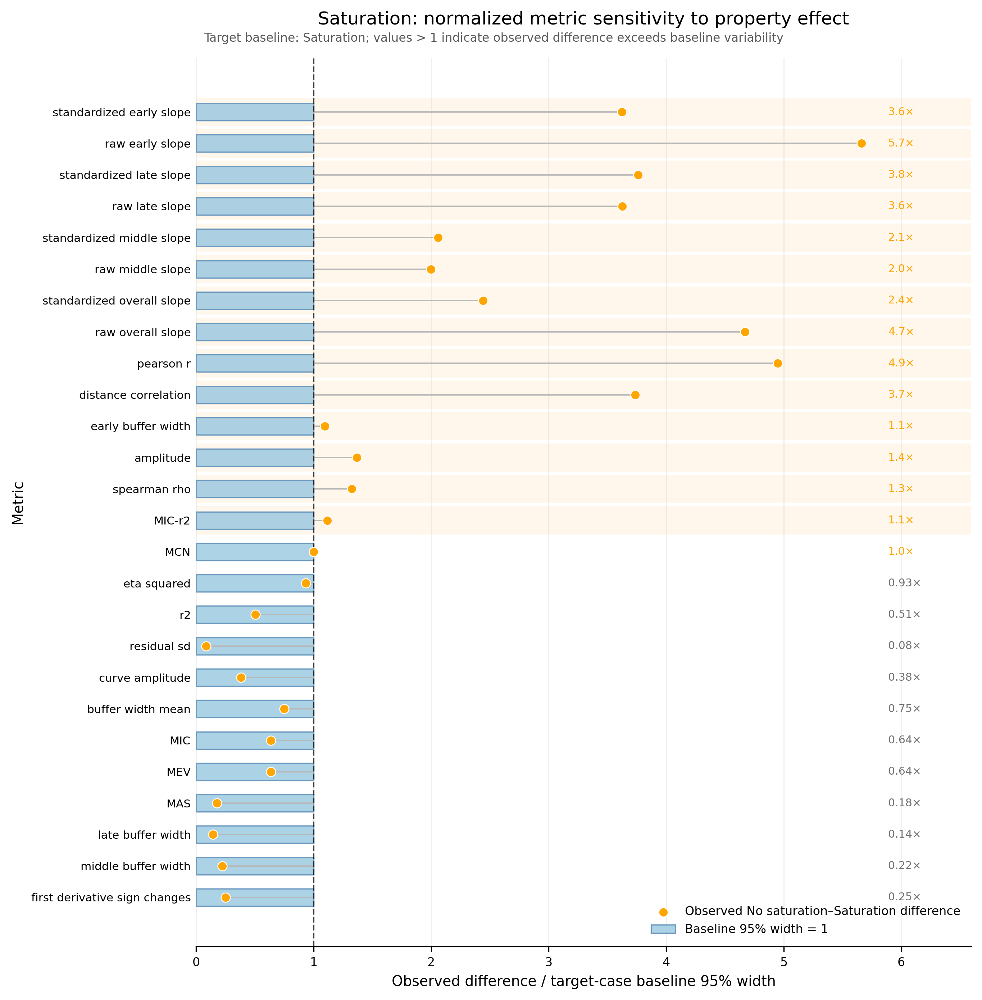

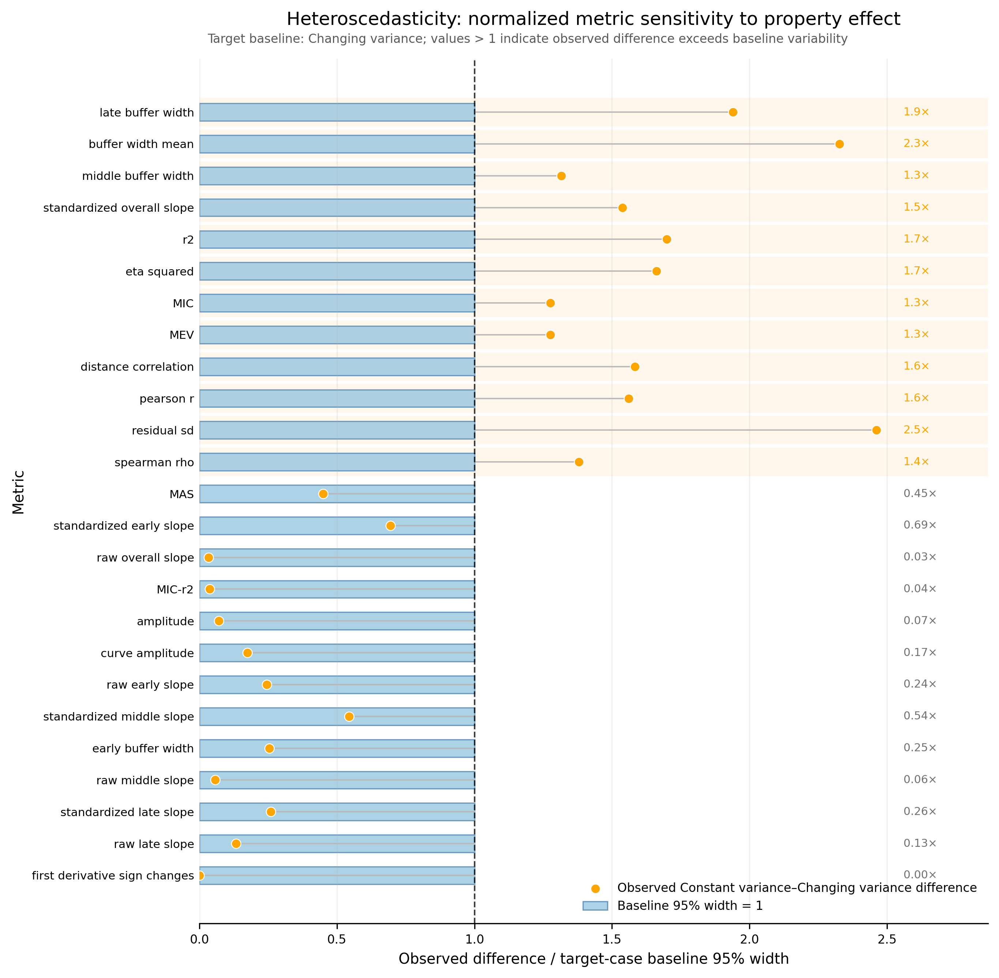

In [10]:
# ==========================================================
# Plot one property:
# Normalized scale
# Blue bar = 1, representing baseline 95% width
# Orange point = observed difference / baseline 95% width
# ==========================================================

def plot_property_baseline_normalized(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
):
    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a = result["case_a_name"]
    case_b = result["case_b_name"]

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
            "ratio_to_baseline_95_width",
        ]
    )

    plot_df = plot_df[plot_df["baseline_95_width"] > 0].copy()

    # Difference between observed effect and 1000-run baseline variability
    # Positive value means observed difference is larger than baseline 95% width
    plot_df["observed_minus_baseline95"] = (
        plot_df["observed_difference"] - plot_df["baseline_95_width"]
    )

    # Sort from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["ratio_to_baseline_95_width"] > 1
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Background highlight
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Baseline normalized bars
    ax.barh(
        y_pos,
        np.ones(n_metrics),
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="Baseline 95% width = 1",
    )

    observed_ratio = plot_df["ratio_to_baseline_95_width"].values

    # Connectors
    for i, ratio in enumerate(observed_ratio):

        ax.plot(
            [1, ratio],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Observed points
    ax.scatter(
        observed_ratio,
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label=f"Observed {case_a}–{case_b} difference",
    )

    # Vertical threshold
    ax.axvline(
        1,
        color="black",
        linestyle="--",
        linewidth=1.0,
        alpha=0.75,
    )

    # Ratio labels
    x_max = max(np.nanmax(observed_ratio), 1)
    x_text = x_max * 1.04 if x_max > 0 else 1

    for i, row in plot_df.iterrows():

        ratio = row["ratio_to_baseline_95_width"]

        if ratio >= 1:
            label = f"{ratio:.1f}×"
            color = "orange"
        else:
            label = f"{ratio:.2f}×"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed difference / target-case baseline 95% width",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: normalized metric sensitivity to property effect",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target baseline: {case_b}; values > 1 indicate observed difference exceeds baseline variability",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()
    plt.show()

plot_property_baseline_normalized(
    property_name="Saturation",
    all_property_results=all_property_results,
    top_k=None,
)

plot_property_baseline_normalized(
    property_name="Heteroscedasticity",
    all_property_results=all_property_results,
    top_k=None,
)

,property,metric,ratio_to_baseline_95_width,observed_difference,baseline_95_width,larger_than_baseline_95_width
0,Direction,spearman rho,295.052114,1.974664,0.006693,True
1,Direction,pearson r,298.690538,1.973650,0.006608,True
2,Direction,standardized overall slope,13.936941,1.874085,0.134469,True
3,Direction,standardized late slope,7.609833,1.868407,0.245525,True
4,Direction,standardized middle slope,6.956710,1.843560,0.265005,True
...,...,...,...,...,...,...
343,Certainty,curve amplitude,0.226183,0.053856,0.238109,False
344,Certainty,raw middle slope,0.053125,0.034233,0.644382,False
345,Certainty,MAS,0.251126,0.028677,0.114195,False
346,Certainty,raw overall slope,0.164147,0.021946,0.133697,False


metric,MAS,MCN,MEV,MIC,MIC-r2,amplitude,buffer width mean,curve amplitude,distance correlation,early buffer width,...,raw late slope,raw middle slope,raw overall slope,residual sd,spearman rho,standardized early slope,standardized late slope,standardized middle slope,standardized overall slope,x bin count coefficient of variation
property,,,,,,,,,,,,,,,,,,,,,
Certainty,0.251126,NaN,1.614754,1.614754,0.402935,0.334247,2.643310,0.226183,1.729865,1.349789,...,0.146901,0.053125,0.164147,3.018826,1.657530,0.150191,0.447326,0.493767,1.871444,NaN
Clustering,0.542153,0.679058,2.736564,NaN,0.561630,4.910441,0.957480,2.128945,0.099758,0.392131,...,0.281435,NaN,0.126693,2.657049,1.516101,NaN,NaN,0.442303,1.464678,4.65543
Convexity / Concavity,0.288650,1.000000,0.362405,0.362405,0.391651,1.878828,0.741668,0.921811,0.031930,1.154644,...,4.592204,1.070912,3.871027,0.091845,0.274988,3.866383,4.264349,0.817551,1.102230,NaN
Density,0.617617,1.586947,0.817380,0.821119,0.804788,0.403624,0.263811,0.245959,0.568137,0.791620,...,0.013612,0.097141,0.334467,0.023445,1.130993,0.376277,0.214742,0.032784,0.100797,NaN
Direction,0.149613,0.525383,0.262825,0.262825,0.209687,0.324470,0.283479,0.373203,0.247070,0.049545,...,7.369881,7.654062,37.511136,0.028601,295.052114,7.654161,7.609833,6.956710,13.936941,NaN
Heteroscedasticity,0.449976,NaN,1.276239,1.276239,0.036639,0.070419,2.326817,0.173871,1.583690,0.254047,...,0.132791,0.056403,0.032973,2.461968,1.380165,0.694646,0.259465,0.543805,1.538768,NaN
Monotonicity,5.574180,0.000000,0.000000,0.000000,15.021480,2.105837,1.637718,1.855415,24.147737,0.552338,...,6.627165,11.889899,23.703944,0.705880,17.757609,0.511661,3.731674,9.015988,19.773976,NaN
Non-linearity,0.048311,0.284383,0.000000,0.000000,1.447354,0.327236,0.007085,0.136912,2.103285,0.486337,...,2.860767,0.185120,0.271571,0.032257,0.520334,2.608165,2.358476,0.043001,0.160100,NaN
Saturation,0.176356,1.000000,0.636467,0.636467,1.115629,1.368765,0.749499,0.381352,3.736036,1.094447,...,3.624641,1.997310,4.670621,0.083877,1.323434,3.622572,3.760780,2.060341,2.443008,NaN


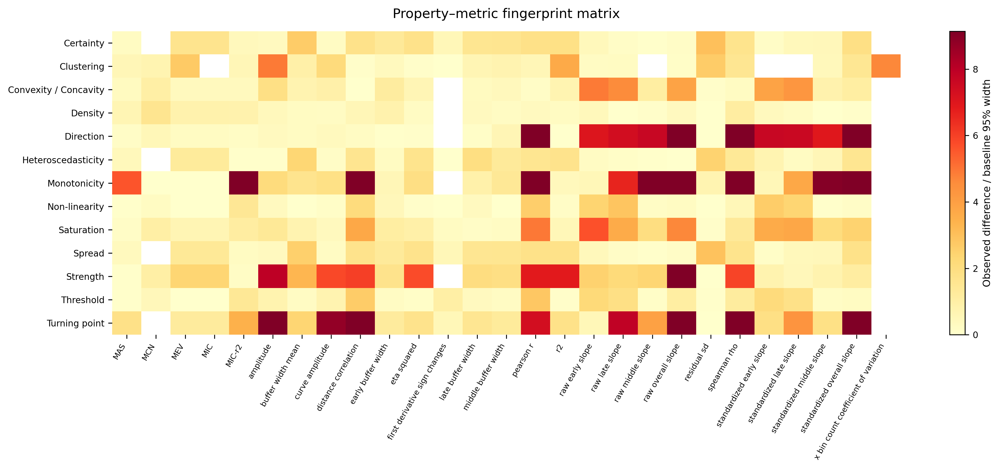

In [11]:
# ==========================================================
# Build property-metric fingerprint matrix
# Value = observed_difference / baseline_95_width
# ==========================================================

fingerprint_records = []

for property_name, result in all_property_results.items():

    comparison_df = result["comparison_df"].copy()

    for _, row in comparison_df.iterrows():

        fingerprint_records.append({
            "property": property_name,
            "metric": row["metric"],
            "ratio_to_baseline_95_width": row["ratio_to_baseline_95_width"],
            "observed_difference": row["observed_difference"],
            "baseline_95_width": row["baseline_95_width"],
            "larger_than_baseline_95_width": row["larger_than_baseline_95_width"],
        })

fingerprint_long_df = pd.DataFrame(fingerprint_records)

fingerprint_matrix = fingerprint_long_df.pivot_table(
    index="property",
    columns="metric",
    values="ratio_to_baseline_95_width",
    aggfunc="mean",
)

display(fingerprint_long_df)
display(fingerprint_matrix)

# ==========================================================
# Heatmap of property-metric fingerprints
# Value = observed_difference / baseline_95_width
# ==========================================================

def plot_fingerprint_heatmap(
    fingerprint_matrix,
    vmax=None,
    figsize=(14, 6),
):
    matrix = fingerprint_matrix.copy()

    matrix = matrix.replace([np.inf, -np.inf], np.nan)

    if vmax is None:
        vmax = np.nanpercentile(matrix.values, 95)

    fig, ax = plt.subplots(
        figsize=figsize,
        dpi=300,
    )

    im = ax.imshow(
        matrix.values,
        aspect="auto",
        vmin=0,
        vmax=vmax,
        cmap="YlOrRd",
    )

    ax.set_xticks(np.arange(matrix.shape[1]))
    ax.set_xticklabels(
        matrix.columns,
        rotation=60,
        ha="right",
        fontsize=7,
    )

    ax.set_yticks(np.arange(matrix.shape[0]))
    ax.set_yticklabels(
        matrix.index,
        fontsize=8,
    )

    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(
        "Observed difference / baseline 95% width",
        fontsize=9,
    )
    cbar.ax.tick_params(labelsize=8)

    ax.set_title(
        "Property–metric fingerprint matrix",
        fontsize=12,
        pad=12,
    )

    for spine in ["top", "right", "left", "bottom"]:
        ax.spines[spine].set_visible(False)

    plt.tight_layout()
    plt.show()


plot_fingerprint_heatmap(
    fingerprint_matrix,
    vmax=None,
    figsize=(14, 6),
)